# Setup

In [1]:
# Libs
import phobos
import numpy as np
import matplotlib.pyplot as plt
import time
import pickle
from tqdm import tqdm
import sys
from pathlib import Path

✅ BMC lib found. Running in control mode.


In [2]:
# Constants
lam = 1551 # [nm]
light_lam = 1551 # [nm]

In [3]:
# shortcuts
dm = phobos.DM()
cam = phobos.Cred3()
chip = phobos.Arch6()
chip.turn_off()
inj_seg = phobos.Config().get('injection.segments')
print('Injected segments:', inj_seg)


DEBUG - SDK Install Path: /opt/Boston Micromachines
DEBUG - BMC_PCIeOpenDM 27BW007#051 0
DEBUG - 1 BMC PCIe cards installed.
DEBUG - Using automatic devId: 1
DEBUG - BMC_PCIeOpenDM opening 0
INFO - PCIe HW Rev: 20000502
DEBUG - Loading map file: /opt/Boston Micromachines/Map/KILO507.map expected count: 1024
INFO - Loading calibration for DM: 27BW07#051_5_3_setof14
DEBUG - Loading map file: /opt/Boston Micromachines/Map/KILO507.map expected count: 1024
Cred3 camera initialized with dark subtraction
Injected segments: [138, 137, 136, 135]


In [4]:
# Setup
path = phobos.archive.new('2T_charac', verbose=True)

Archive created at /mnt/disk1/archive/2026-08-17_347a303/2_2T_charac


In [5]:
phobos.Config().set('dm.stabilization_time', 0.002, autosave=False)
phobos.Config().set('photonic_chip.stabilization_time', 0.003, autosave=False)

In [5]:
phobos.Config().get('photonic_chip.stabilization_time')

0.003

# Check cropping

✅ Cred3 reset to configuration defaults.


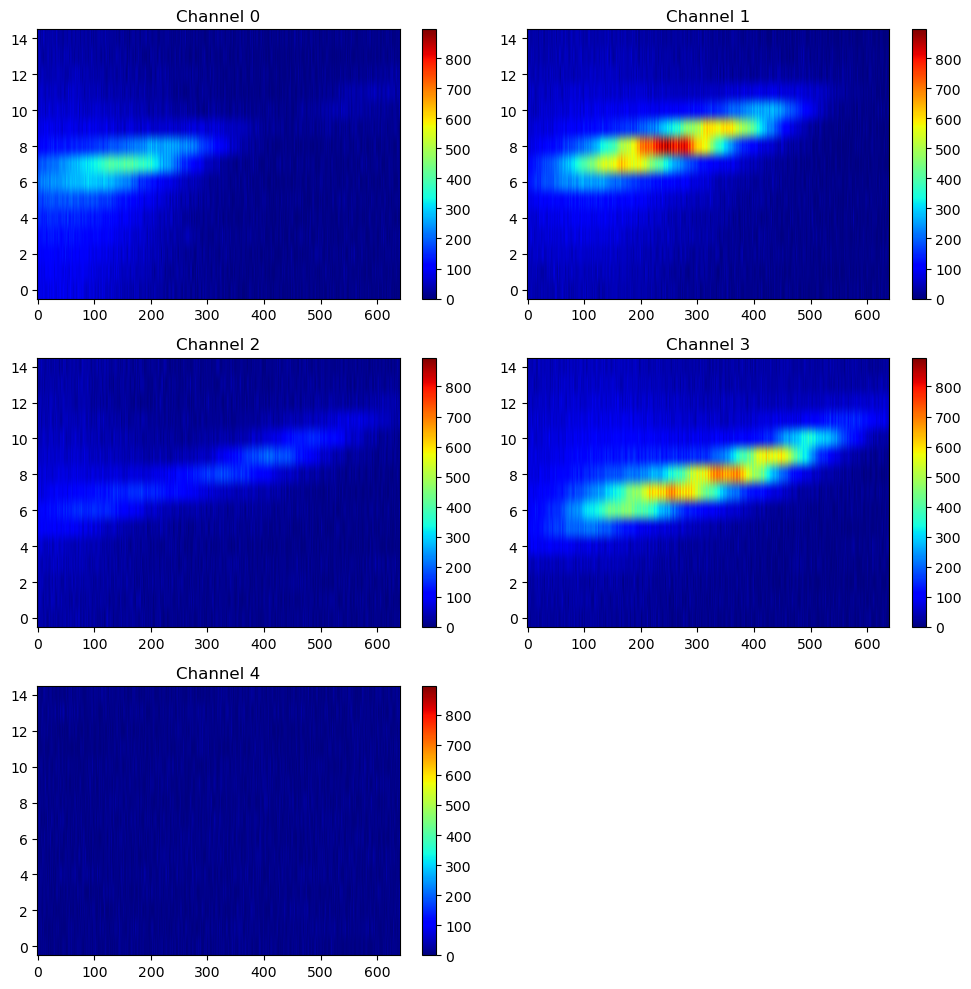

In [12]:
# check cropping
phobos.Config().reload()
cam.reset()
cam.check_cropping(crop_mode='rectangles')

# Calibration injection

In [8]:
# Injection calibration
inj = phobos.Injection()


In [ ]:
# inj.zero()
# maps = inj.get_injection_maps(verbose=True)
# inj.zero()

# fig = plt.figure(figsize=(10,10))
# for i in range(4):
#     image = maps[0][i]
#     tip_range = tilt_ramp = maps[1]
#     tilt_step = np.diff(tilt_ramp)[0]
#     tip_step = np.diff(tip_range)[0]
#     plt.subplot(2,2,i+1)
#     plt.imshow(image, origin='lower', cmap='jet',
#             extent=[tilt_ramp.min()-tilt_step/2, tilt_ramp.max()+tilt_step/2,
#                     tip_range.min()-tip_step/2, tip_range.max()+tip_step/2],
#             vmin=maps[0].min(),
#             vmax=maps[0].max())
#     plt.colorbar()
#     plt.xlabel('Tilt (mrad)')
#     plt.ylabel('Tip (mrad)')
# plt.tight_layout()

Scanning injection maps:   0%|          | 0/4 [00:00<?, ?it/s]

  Channel 0 (segment 138): scanning…
Injection OFF on channels [1, 2, 3] (segments [137, 136, 135])


Scanning injection maps:  25%|██▌       | 1/4 [00:14<00:43, 14.43s/it]

Injection OFF on channels [0] (segments [138])
  Channel 1 (segment 137): scanning…
Injection OFF on channels [0, 2, 3] (segments [138, 136, 135])


Scanning injection maps:  50%|█████     | 2/4 [00:33<00:34, 17.21s/it]

Injection OFF on channels [1] (segments [137])
  Channel 2 (segment 136): scanning…
Injection OFF on channels [0, 1, 3] (segments [138, 137, 135])


Scanning injection maps:  75%|███████▌  | 3/4 [00:53<00:18, 18.52s/it]

Injection OFF on channels [2] (segments [136])
  Channel 3 (segment 135): scanning…
Injection OFF on channels [0, 1, 2] (segments [138, 137, 136])


Scanning injection maps: 100%|██████████| 4/4 [01:13<00:00, 18.30s/it]

Injection OFF on channels [3] (segments [135])
Injection FLAT on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])

── Find gross TT for max injection and spread ──
Injection spread of seg=138: (tip, tilt) = (0.67523,0.76072) mrad
Injection spread of seg=137: (tip, tilt) = (0.69507,0.77298) mrad
Injection spread of seg=136: (tip, tilt) = (0.69459,0.76480) mrad
Injection spread of seg=135: (tip, tilt) = (0.72033,0.80134) mrad

── Find precise TT for max injection ──
Injection max of seg=138: (tip, tilt) = (-0.63362,0.27117) mrad; flux = 1733
Injection max of seg=137: (tip, tilt) = (-0.36634,0.16980) mrad; flux = 1588
Injection max of seg=136: (tip, tilt) = (-0.00414,0.06189) mrad; flux = 1521
Injection max of seg=135: (tip, tilt) = (0.16167,0.09328) mrad; flux = 1638
✅ Injection calibration saved to config (injection.max)



── Finding maximum injection points ──

── Balancing injection fluxes ──
  Weakest channel: 2 (seg 136), target flux = 1493
  Dichotomy on channel 0 (seg 138)…
Injection OFF on channels [1, 2, 3] (segments [137, 136, 135])
    → balanced tilt = 0.5014 mrad, flux = 1495 (target 1493), iterations = 13
  Dichotomy on channel 1 (seg 137)…
Injection OFF on channels [0, 2, 3] (segments [138, 136, 135])
    → balanced tilt = 0.2002 mrad, flux = 1469 (target 1493), iterations = 13
  Dichotomy on channel 3 (seg 135)…
Injection OFF on channels [0, 1, 2] (segments [138, 137, 136])
    → balanced tilt = 0.2002 mrad, flux = 1483 (target 1493), iterations = 13
Injection FLAT on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
✅ Injection calibration saved to config (injection.balanced)


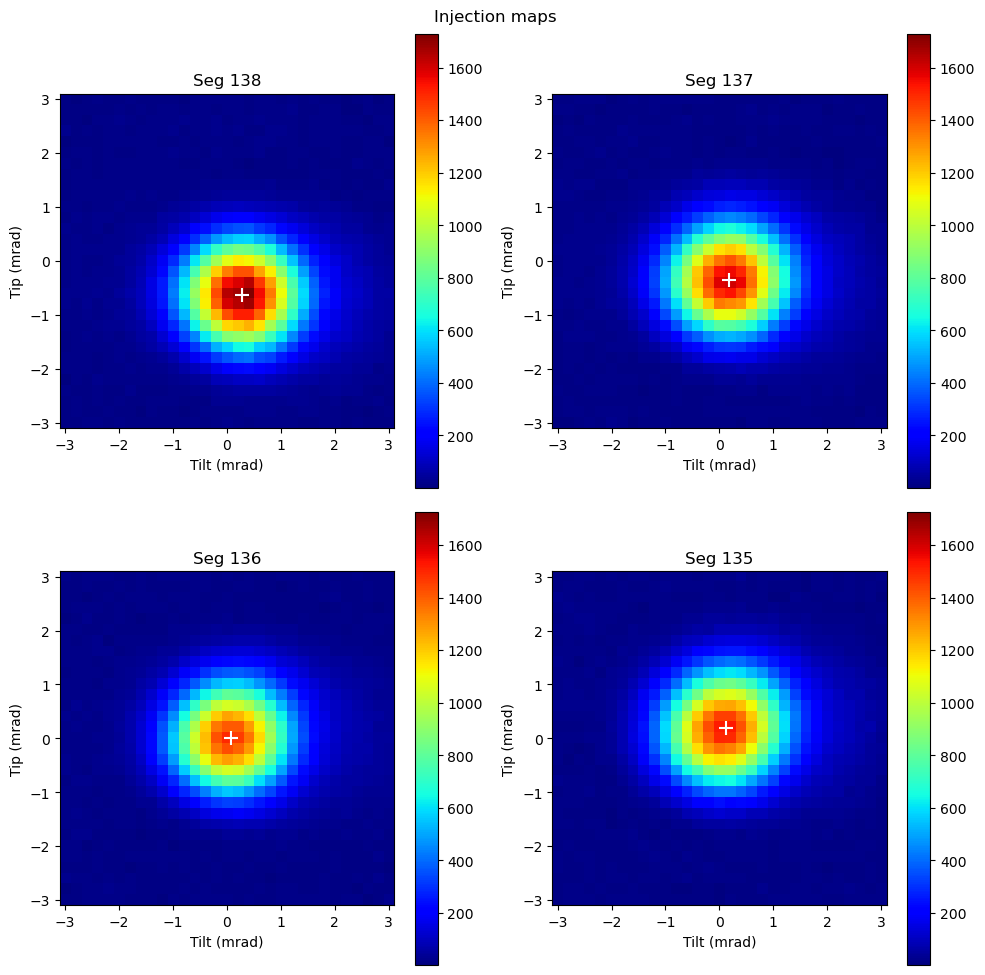

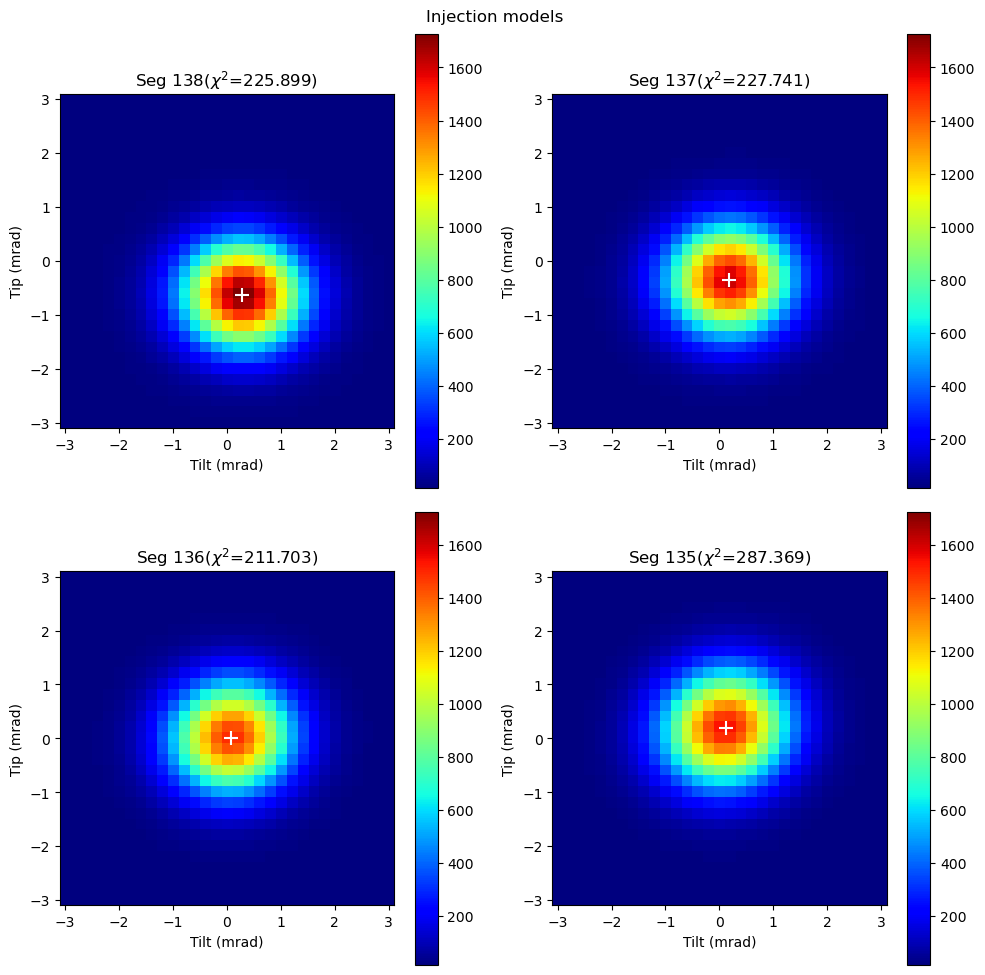

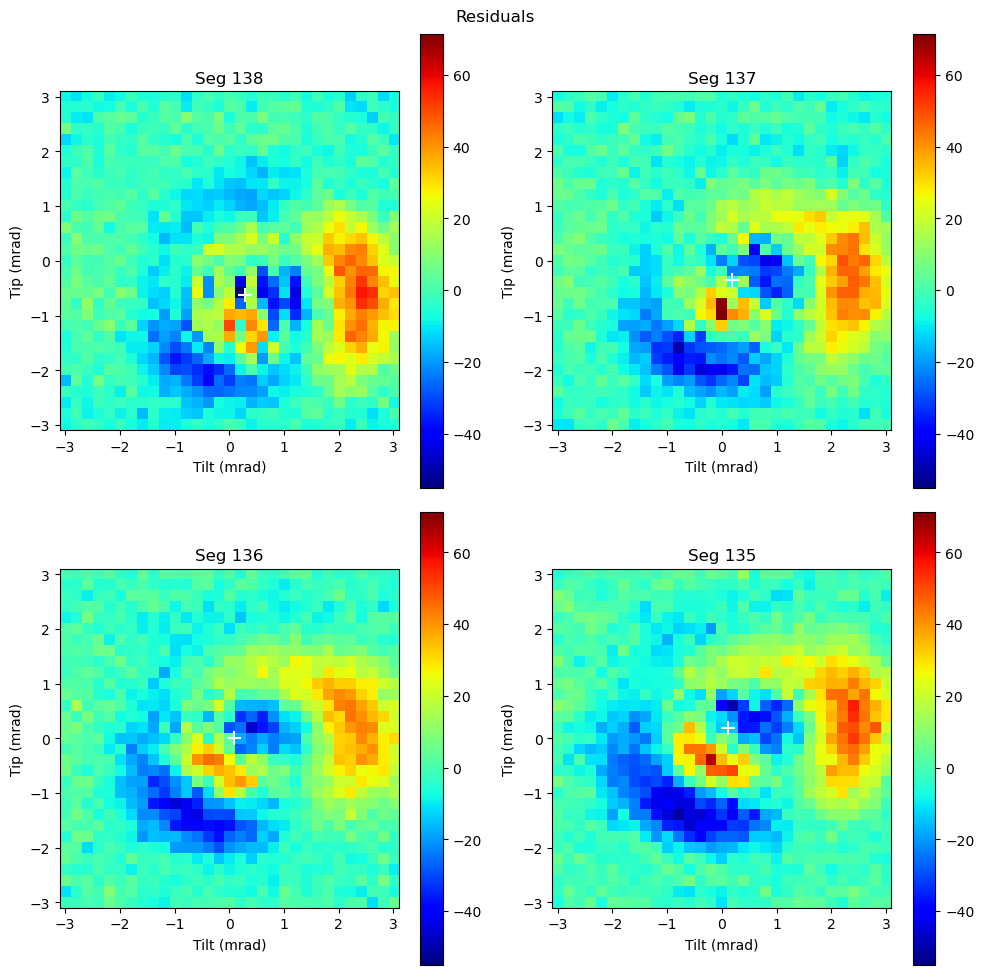

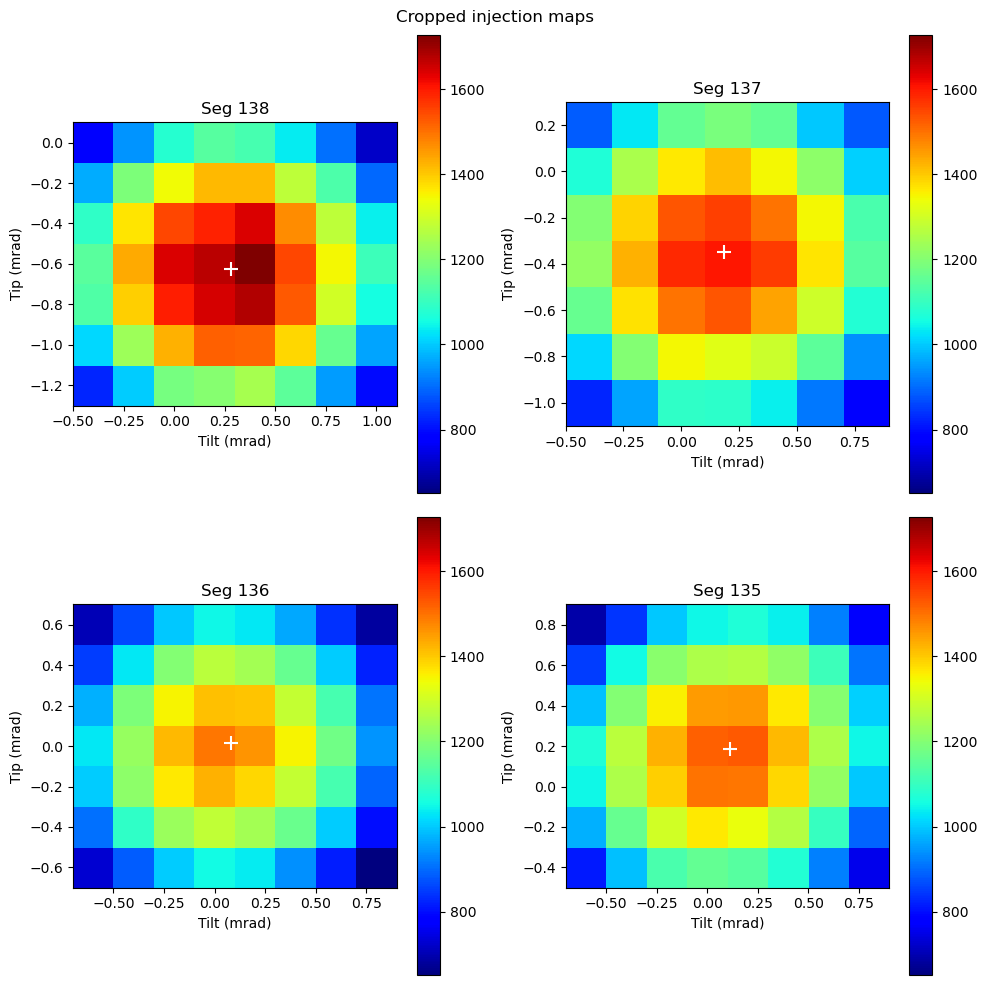

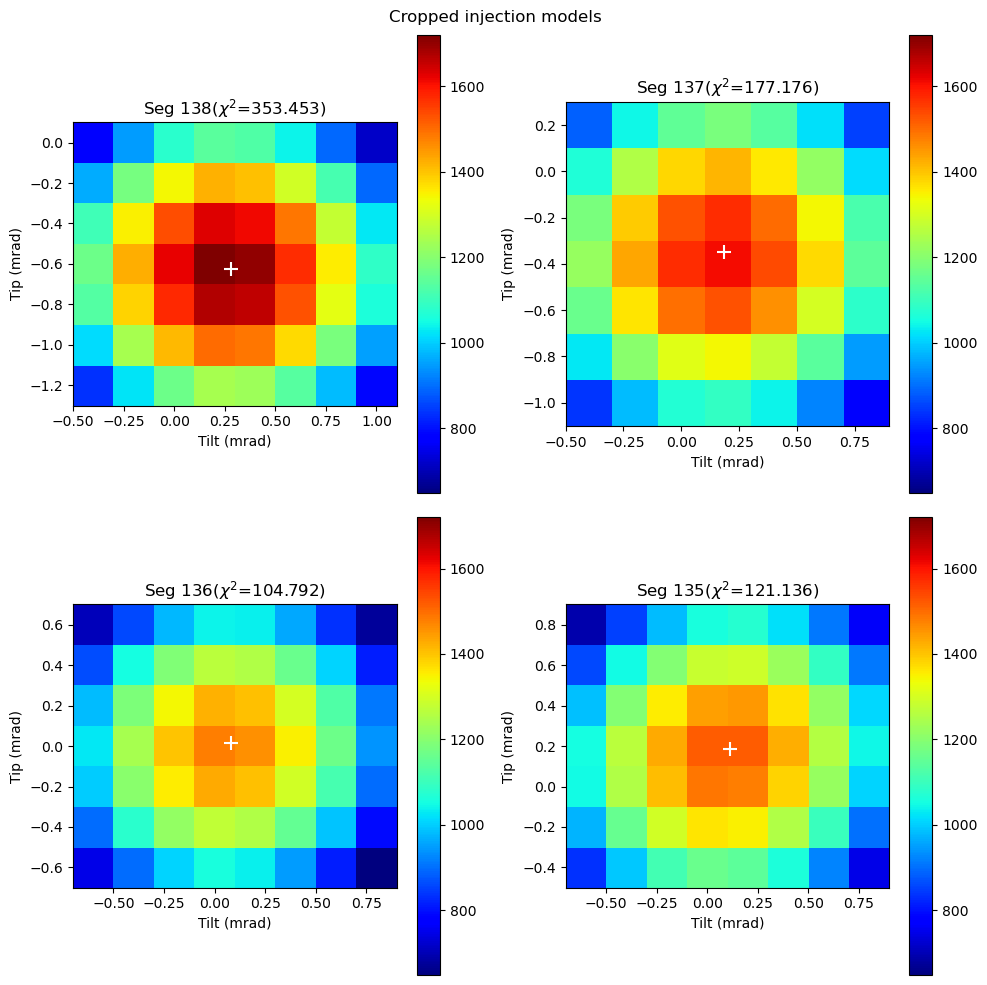

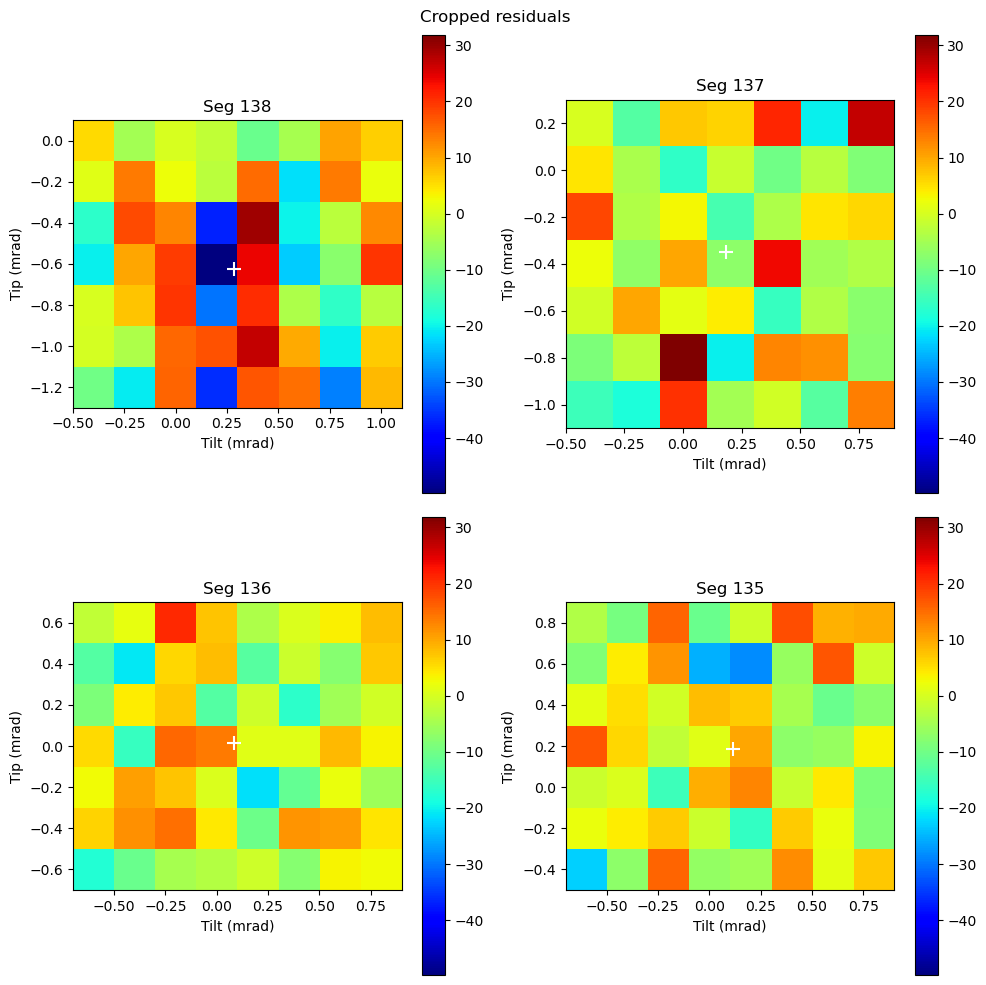

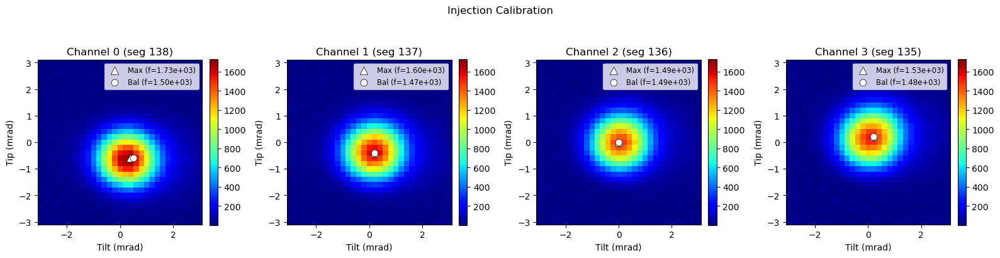

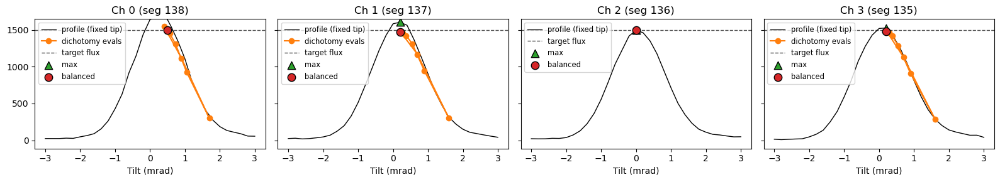

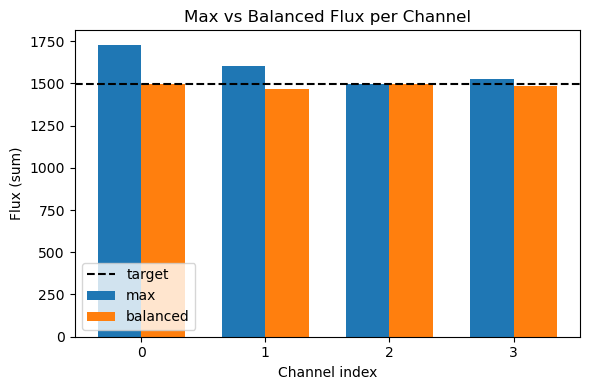

Successfully saved in FITS
Injection ZERO on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


In [11]:
# Injection calibration
avg_frame = 1
avg_frames_bal = 5
out_inj = inj.calibrate(verbose=True, plot=True, save_path=path, 
                        avg_frames=avg_frame, avg_frames_bal=avg_frames_bal,
                        tilt_tol = 0.5e-3, no_balancing=False)

inj.zero()

# Phase shifter calibration

Injection MAX on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
  - Scanning shifter 17...
  ✅ Shifter 17 calibrated: Period=0.5993 W -> Coeff=0.0954 W/rad
  - Scanning shifter 18...
  ✅ Shifter 18 calibrated: Period=0.5950 W -> Coeff=0.0947 W/rad
  - Scanning shifter 19...
  ✅ Shifter 19 calibrated: Period=0.5891 W -> Coeff=0.0938 W/rad
  - Scanning shifter 20...
  ✅ Shifter 20 calibrated: Period=0.5870 W -> Coeff=0.0934 W/rad


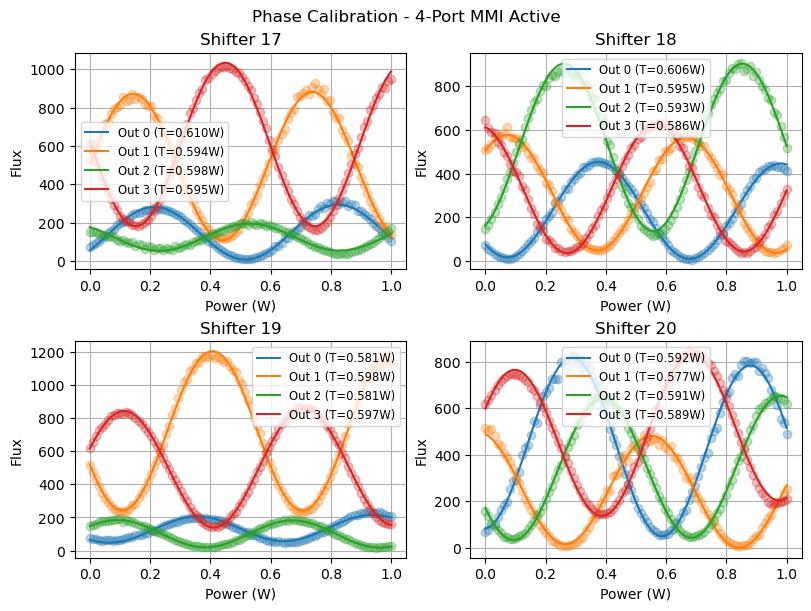

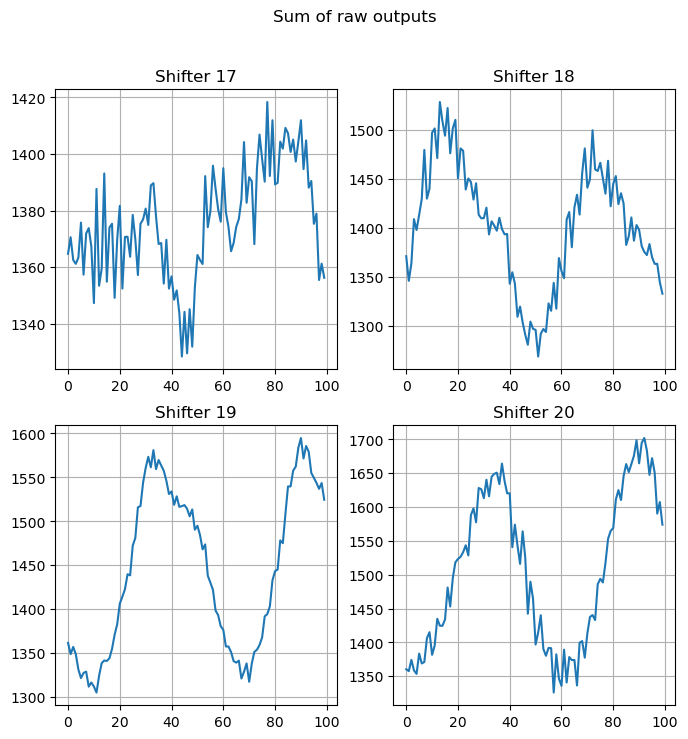

In [9]:
inj.set_max()

avg_frames = 5
# TOPAs calibration
chip_coeffs, chip_scans, chip_power_range = chip.phase_calibration(plot=True, verbose=False, crop_mode='centers', nroi=4)

np.save(path / "chip_coeffs.npy", chip_coeffs)
np.savez(path / "chip_scans.npz", chip_scans=chip_scans, chip_power_range=chip_power_range)

s = chip_scans[:,:,::-1].sum(2)
plt.figure(figsize=(8,8))
plt.suptitle("Sum of raw outputs")
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.plot(s[i].T)
    plt.grid()
    plt.title(f"Shifter {chip.shifters[i].channel}")

chip.turn_off()
    

# Pair scan

## With DM

Injection BALANCED on channels [0, 1] (segments [138, 137])
Injection BALANCED on channels [0, 1] (segments [138, 137])
Injection BALANCED on channels [0, 2] (segments [138, 136])
Injection BALANCED on channels [0, 2] (segments [138, 136])
Injection BALANCED on channels [0, 3] (segments [138, 135])
Injection BALANCED on channels [0, 3] (segments [138, 135])
Injection BALANCED on channels [1, 2] (segments [137, 136])
Injection BALANCED on channels [1, 2] (segments [137, 136])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Injection BALANCED on channels [2, 3] (segments [136, 135])
Injection BALANCED on channels [2, 3] (segments [136, 135])
Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


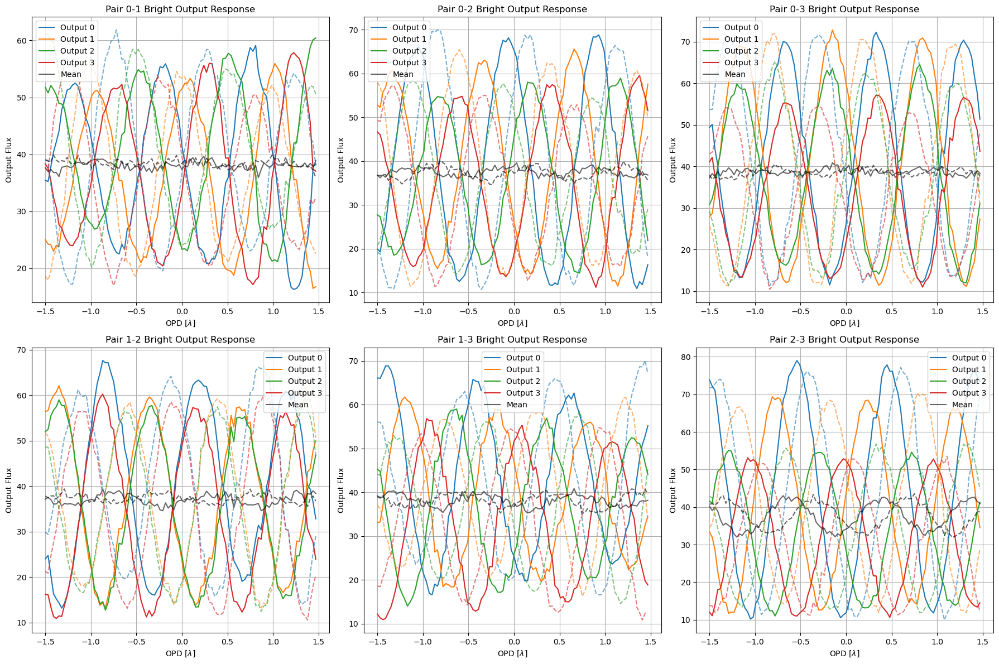

In [13]:
pairs = [(0,1), (0,2), (0,3), (1,2), (1,3), (2,3)]
nb_lam = 3.
crop_mode = 'rectangles_integrated'
shapes = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode)
n_roi = shapes.shape[0] - 1

res_pair_scan = {}

fig, axs = plt.subplots(2, 3, figsize=(18, 12))
axs = axs.flatten()
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
for i, pair in enumerate(pairs):
    inj.off(verbose=False)
    inj.set_balanced(np.array(pair))

    ref_tip = (dm[inj_seg[pair[0]]].get_tip(), dm[inj_seg[pair[1]]].get_tip())
    ref_tilt = (dm[inj_seg[pair[0]]].get_tilt(), dm[inj_seg[pair[1]]].get_tilt())

    ref_cart = dm[inj_seg[pair[1]]].get_piston()
    start = ref_cart - nb_lam * lam/2./2.
    piston_range = np.linspace(start, start + nb_lam * lam/2., 100, endpoint=False)  # [nm]
    opd_range = (piston_range - ref_cart) * 2


    # Scan on first input
    outs = np.empty((len(piston_range), n_roi))
    for p, piston in enumerate(piston_range):
        dm[inj_seg[pair[0]]].set_ptt(piston, ref_tip[0], ref_tilt[0])
        if p == 0:
            time.sleep(0.1)
        outs[p] = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode)[:n_roi]

    dm[inj_seg[pair[0]]].set_ptt(ref_cart, ref_tip[0], ref_tilt[0])
    time.sleep(0.1)

    data = np.hstack((opd_range[:,None], outs.copy()))
    res_pair_scan[(pair[0], pair[1])] = data

    for o in range(n_roi):
        axs[i].plot(opd_range / lam, outs[:, o], color=colors[o], label=f'Output {o}')
    axs[i].plot(opd_range / lam, outs.mean(1), color='k', linestyle='-', alpha=0.6, label='Mean')

    # Scan on second input
    inj.off(verbose=False)
    inj.set_balanced(np.array(pair))

    outs = np.empty((len(piston_range), n_roi))
    for p, piston in enumerate(piston_range):
        dm[inj_seg[pair[1]]].set_ptt(piston, ref_tip[1], ref_tilt[1])
        if p == 0:
            time.sleep(0.1)
        outs[p] = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode)[:n_roi]

    dm[inj_seg[pair[0]]].set_ptt(ref_cart, ref_tip[0], ref_tilt[0])
    time.sleep(0.1)

    data = np.hstack((opd_range[:,None], outs.copy()))
    res_pair_scan[(pair[1], pair[0])] = data

    for o in range(n_roi):
        axs[i].plot(opd_range / lam, outs[:, o], color=colors[o], linestyle='--', alpha=0.6)
    axs[i].plot(opd_range / lam, outs.mean(1), color='k', linestyle='--', alpha=0.6)
    
    axs[i].set_title(f'Pair {pair[0]}-{pair[1]} Bright Output Response')
    axs[i].set_xlabel(r'OPD [$\lambda$]')
    axs[i].set_ylabel('Output Flux')
    axs[i].legend()
    axs[i].grid()

fig.tight_layout()
filename = 'pair_dm_scan_start%.0f_nb_lam%s.png'%(start, nb_lam)
fig.savefig(path / filename, dpi=150, format='png')

filename = 'pair_dm_scan_data_start%.0f_nb_lam%s.pkl'%(start, nb_lam)
with open(path / filename, 'wb') as f:
    pickle.dump(res_pair_scan, f)


inj.set_balanced()

## With phase shifters

Injection BALANCED on channels [0, 1] (segments [138, 137])
Injection BALANCED on channels [0, 1] (segments [138, 137])
Injection BALANCED on channels [0, 2] (segments [138, 136])


KeyboardInterrupt: 

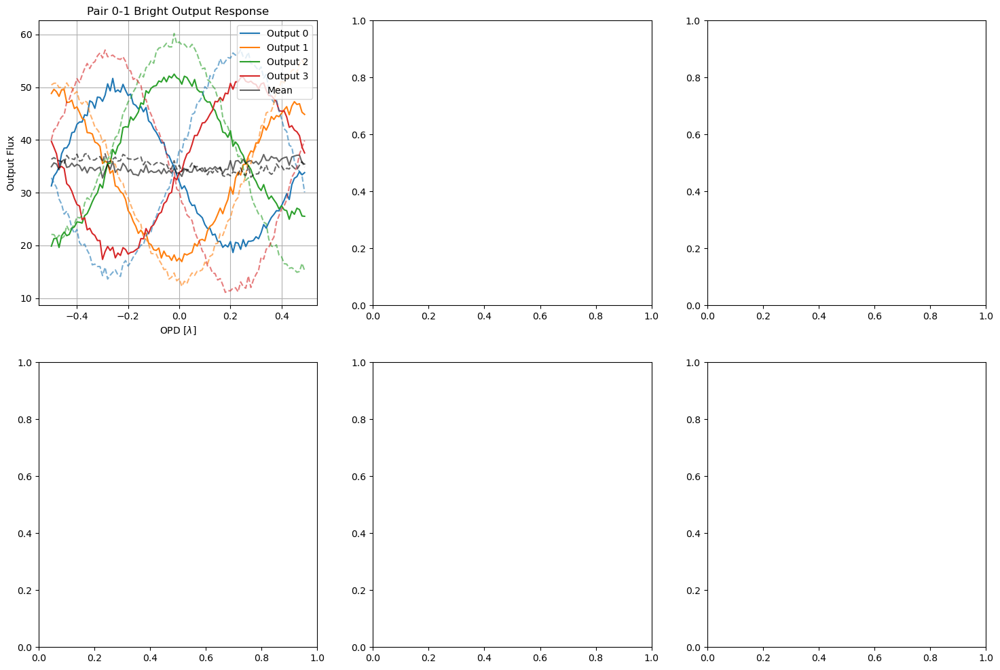

In [18]:
pairs = [(0,1), (0,2), (0,3), (1,2), (1,3), (2,3)]
nb_lam = 1.
crop_mode = 'rectangles_integrated'
n_roi = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode).size - 1
phase_offset = np.pi

res_pair_scan_ps = {}

fig, axs = plt.subplots(2, 3, figsize=(18, 12))
axs = axs.flatten()
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
for i, pair in enumerate(pairs):
    inj.off(verbose=False)
    inj.set_balanced(np.array(pair))

    ref_cart = dm[inj_seg[pair[1]]].get_piston()
    start = ref_cart - nb_lam * lam/2./2.
    piston_range = np.linspace(start, start + nb_lam * lam/2., 100, endpoint=False)  # [nm]
    opd_range = (piston_range - ref_cart) * 2

    # Scan on first input
    outs = np.empty((len(piston_range), n_roi))
    for p, piston in enumerate(piston_range):
        phase = 2 * np.pi / lam * opd_range[p]
        phases = np.zeros(4)
        phases[pair[0]] = phase + phase_offset
        chip.set_phases(phases)
        outs[p] = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode)[:n_roi]

    chip.turn_off()
    data = np.hstack((opd_range[:,None], outs.copy()))
    res_pair_scan_ps[(pair[0], pair[1])] = data

    for o in range(n_roi):
        axs[i].plot(opd_range / lam, outs[:, o], color=colors[o], label=f'Output {o}')
    axs[i].plot(opd_range / lam, outs.mean(1), color='k', linestyle='-', alpha=0.6, label='Mean')

    # Scan on second input
    inj.off(verbose=False)
    inj.set_balanced(np.array(pair))

    outs = np.empty((len(piston_range), 4))
    for p, piston in enumerate(piston_range):
        phase = 2 * np.pi / lam * opd_range[p]
        phases = np.zeros(4)
        phases[pair[1]] = phase + phase_offset
        chip.set_phases(phases)      
        outs[p] = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode)[:n_roi]

    chip.turn_off()
    data = np.hstack((opd_range[:,None], outs.copy()))
    res_pair_scan_ps[(pair[1], pair[0])] = data

    for o in range(n_roi):
        axs[i].plot(opd_range / lam, outs[:, o], color=colors[o], linestyle='--', alpha=0.6)
    axs[i].plot(opd_range / lam, outs.mean(1), color='k', linestyle='--', alpha=0.6)
    
    axs[i].set_title(f'Pair {pair[0]}-{pair[1]} Bright Output Response')
    axs[i].set_xlabel(r'OPD [$\lambda$]')
    axs[i].set_ylabel('Output Flux')
    axs[i].legend()
    axs[i].grid()

fig.tight_layout()
filename = 'pair_ps_scan_start%.0f_nb_lam%s.png'%(start, nb_lam)
fig.savefig(path / filename)

filename = 'pair_ps_scan_data_start%.0f_nb_lam%s.pkl'%(start, nb_lam)
with open(path / filename, 'wb') as f:
    pickle.dump(res_pair_scan_ps, f)


inj.set_balanced()
chip.turn_off()

# Upstream piston RMS regimes
## Setup

In [87]:
def rms_scan(n, rms_values, avg_value, wl, pair, correct_with_topas=False, plot=True, use_dm=True, use_phase2=False):
    inj.off()
    chip.turn_off()
    inj.set_balanced(pair)
    dm[inj_seg[pair[0]]].set_ptt(avg_value, 
                                 dm[inj_seg[pair[0]]].get_tip(), 
                                 dm[inj_seg[pair[0]]].get_tilt())
    ref_cart = [dm[inj_seg[pair[0]]].get_piston(), dm[inj_seg[pair[1]]].get_piston()]
    print('Ref positions:', ref_cart)
    ref_tip = (dm[inj_seg[pair[0]]].get_tip(), dm[inj_seg[pair[1]]].get_tip())
    ref_tilt = (dm[inj_seg[pair[0]]].get_tilt(), dm[inj_seg[pair[1]]].get_tilt())
    n_outputs = cam.get_outputs(flux_mode='mean').size

    res = {}

    dm[inj_seg[pair[0]]].set_ptt(ref_cart[0], ref_tip[0], ref_tilt[0])

    if plot:
        fig, axs = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle(f'Upstream Piston RMS Regimes - Pair {pair[0]}-{pair[1]}', fontsize=16)
        axs = axs.flatten()
        colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'black', 'grey']
    else:
        fig = None

    for i, rms in enumerate(rms_values):
        try:
            rms_text = 'lambda/%.4f...'%(lam/rms)
        except ZeroDivisionError:
            rms_text = '0 lambda'
        print('Scanning RMS=%.4f nm' % (rms) + ' --- ' + rms_text)

        outs = np.empty((n, n_outputs))
        res_pistons = np.empty((n, 2))
        res_phases = np.empty((n,))
        np.random.seed(0)
        for p in tqdm(range(n)):
            diff_pistons = np.random.normal(0., rms/2)  # [nm]
            pistons = ref_cart[0] + diff_pistons

            if use_dm:
                dm[inj_seg[pair[0]]].set_ptt(pistons, ref_tip[0], ref_tilt[0])
                # dm[inj_seg[pair[0]]].set_piston(pistons)

            dopd = diff_pistons * 2 # [nm] get differential OPD from reference point, which is not the 0-OPD
            phase = 2 * np.pi / wl * dopd
            phases = np.zeros(4)
            phases[pair[0]] = phase

            if correct_with_topas:
                if use_phase2:
                    phases[pair[0]] = ((phases[pair[0]] + np.pi) % (2 * np.pi)) - np.pi
                    zeropoints = np.zeros((len(chip.shifters), 2))
                    zeropoints[:,0] = chip_coeffs[:,0]
                    zeropoints[pair[0], 1] = chip_coeffs[pair[0],1] / 2.
                    chip.set_phases2(phases, zeropoints)
                    time.sleep(0.005)
                else:
                    chip.set_phases(phases)

            outs[p] = cam.get_outputs(flux_mode='mean')
            res_pistons[p] = pistons
            res_phases[p] = phase

        try:
            key = lam/rms
        except ZeroDivisionError:
            key = 0
        res[key] = {'flux':outs.copy(), 'pistons': res_pistons, 'phase':res_phases, 'dopd':dopd}

        if plot:
            for o in range(n_outputs):
                axs[i].hist(outs[:, o], bins=20, color=colors[o], alpha=0.7, 
                            label='Output %s (%.2f ± %.2f)'%(o, outs[:, o].mean(), outs[:, o].std()))
            
            axs[i].set_title(r'RMS %s Output Distribution'%(np.around(rms)))
            axs[i].set_xlabel('Output Flux')
            axs[i].set_ylabel('Counts')
            axs[i].legend()
            axs[i].grid()

    if plot:
        fig.tight_layout()

    chip.turn_off()
    inj.off()
    inj.set_balanced(pair)
    # if correct_with_topas:
    #     print('Let TOPA to cooldown for 60 seconds.')
    #     time.sleep(60.)

    return {'data': res, 'figure': fig}

def find_null(nulled_output_idx, pair):
    # Scan to find null
    inj.off()
    inj.set_balanced(pair)
    n_roi = 4
    ref_cart = dm[inj_seg[pair[1]]].get_piston()
    start = ref_cart - 1. * lam/2./2.
    piston_range = np.linspace(start, start + 1. * lam/2., 100, endpoint=False)  # [nm]
    ref_tip = (dm[inj_seg[pair[0]]].get_tip(), dm[inj_seg[pair[1]]].get_tip())
    ref_tilt = (dm[inj_seg[pair[0]]].get_tilt(), dm[inj_seg[pair[1]]].get_tilt())

    outs = np.empty((len(piston_range), n_roi))
    for p, piston in enumerate(piston_range):
        dm[inj_seg[pair[0]]].set_ptt(piston, ref_tip[0], ref_tilt[0])
        if p == 0:
            time.sleep(0.1)
        outs[p] = cam.get_outputs(flux_mode='mean')[:n_roi]


    null_pos = float(piston_range[np.argmin(outs[:,nulled_output_idx])])
    dm[inj_seg[pair[0]]].set_ptt(null_pos, ref_tip[0], ref_tilt[0])
    print('Null position:', null_pos, dm[inj_seg[pair[0]]].get_piston())
    inj.off()
    inj.set_balanced(pair)

    opd_range = (piston_range - ref_cart) * 2
    fig, axs = plt.subplots(1, 1, figsize=(18, 12))
    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

    for o in range(n_roi):
        axs.plot(opd_range / lam, outs[:, o], color=colors[o], label=f'Output {o}')
    axs.plot(opd_range / lam, outs.mean(1), color='k', linestyle='-', alpha=0.6, label='Mean')

    for o in range(n_roi):
        axs.plot(opd_range / lam, outs[:, o], color=colors[o], linestyle='--', alpha=0.6)
    axs.plot(opd_range / lam, outs.mean(1), color='k', linestyle='--', alpha=0.6)

    # Add vertical line marking null position
    null_opd = (null_pos - ref_cart) * 2
    axs.axvline(null_opd / lam, color='red', linestyle='-', linewidth=2, label='Null position')

    axs.set_title(f'Pair {pair[0]}-{pair[1]} Bright Output Response')
    axs.set_xlabel(r'OPD [$\lambda$]')
    axs.set_ylabel('Output Flux')
    axs.legend()
    axs.grid()

    return null_pos

rms_values = [0, lam/24., lam/16., lam/8., lam/4., lam/2.] # OPD RMS [nm], no change, lam/4, lam/2 (swap), lam, fringe jump.

## With DM alone

In [88]:
pair = np.array([1, 3])
nulled_output_idx = 0

Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Null position: -1041.5 -1041.5
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])


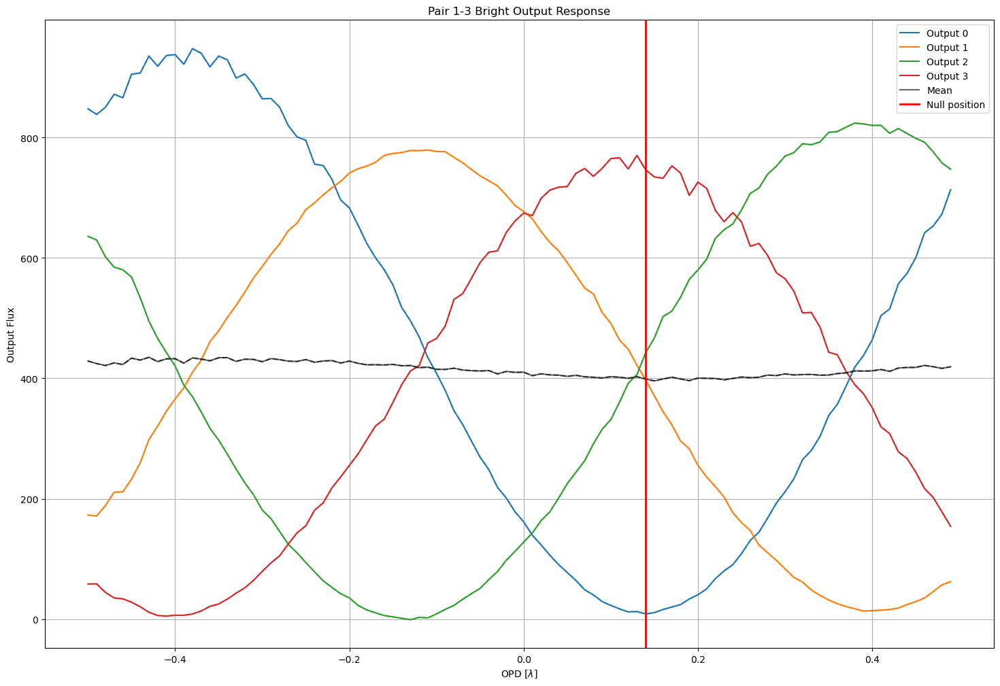

In [89]:
null_pos = find_null(nulled_output_idx, pair)

Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Ref positions: [-1041.5, -1150.0]
Scanning RMS=0.0000 nm --- 0 lambda


100%|██████████| 1000/1000 [00:04<00:00, 220.33it/s]


Scanning RMS=64.5833 nm --- lambda/24.0000...


100%|██████████| 1000/1000 [00:04<00:00, 206.71it/s]


Scanning RMS=96.8750 nm --- lambda/16.0000...


100%|██████████| 1000/1000 [00:04<00:00, 214.61it/s]


Scanning RMS=193.7500 nm --- lambda/8.0000...


100%|██████████| 1000/1000 [00:04<00:00, 228.37it/s]


Scanning RMS=387.5000 nm --- lambda/4.0000...


100%|██████████| 1000/1000 [00:04<00:00, 200.58it/s]


Scanning RMS=775.0000 nm --- lambda/2.0000...


100%|██████████| 1000/1000 [00:05<00:00, 196.65it/s]


Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])


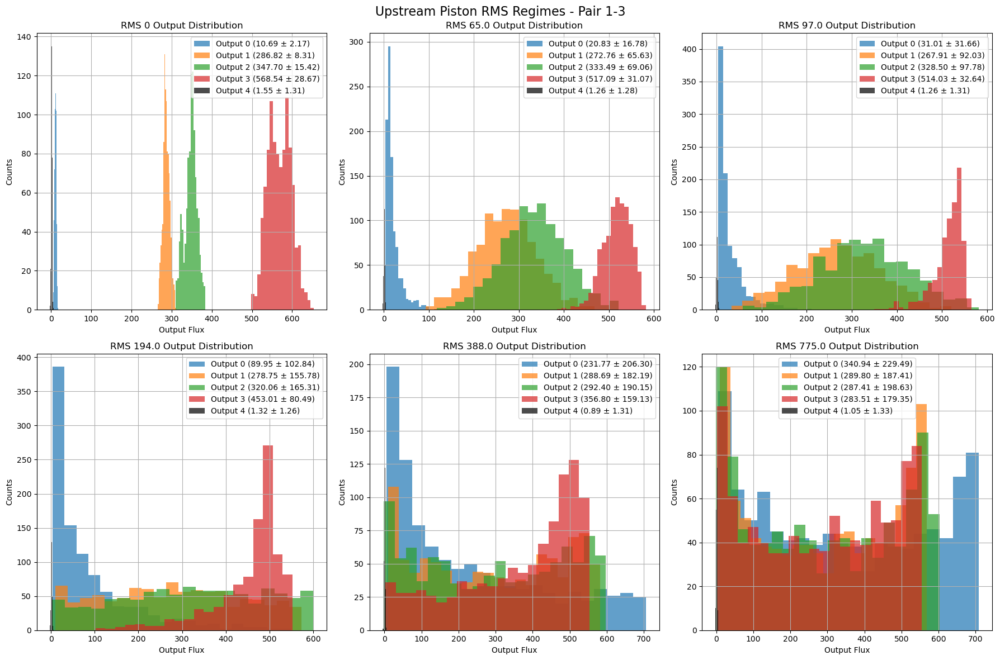

In [91]:
use_topa = False
use_dm = True
res_rms = rms_scan(1000, rms_values, null_pos, lam, pair, use_topa, True, use_dm)

if use_dm:
    text1 = '_with_dm'
else:
    text1 = ''

if use_topa:
    text2 = '_with_topa'
else:
    text2 = ''

filename = 'fig_rms_pair_%s-%s%s%s_lam%s.png'%(pair[0], pair[1], text1, text2, light_lam)
try:
    res_rms['figure'].savefig(path / filename)
except:
    pass

filename = 'res_rms_pair_%s-%s%s%s_lam%s.pkl'%(pair[0], pair[1], text1, text2, light_lam)
with open(path / filename, 'wb') as f:
    pickle.dump(res_rms, f)

## Same with TOPA correction

Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Null position: -1452.25 -1452.25
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])


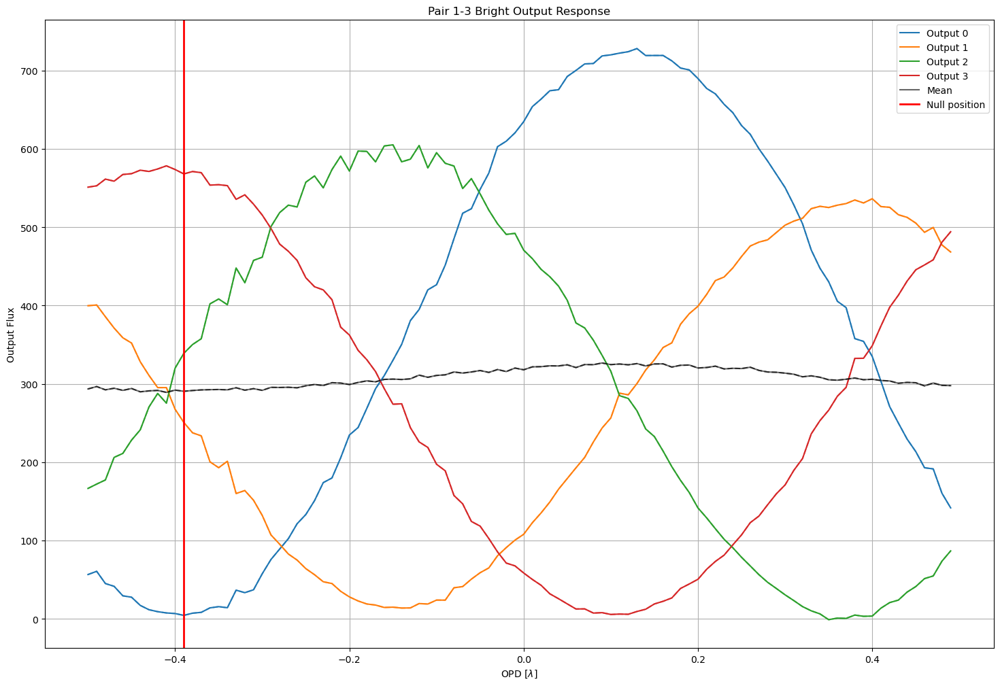

In [92]:
# Scan to find null
inj.off()
inj.set_balanced(pair)
nulled_output_idx = 0
zeropoints = np.zeros((len(chip.shifters), 2))
zeropoints[:,0] = chip_coeffs[:,0]
zeropoints[pair[0], 1] = chip_coeffs[pair[0],1] / 2.

chip.set_phases2(np.zeros(len(chip.shifters)), zeropoints)
null_pos_topa = find_null(nulled_output_idx, pair)

dm[inj_seg[pair[0]]].set_ptt(null_pos_topa, dm[inj_seg[pair[0]]].get_tip(), dm[inj_seg[pair[0]]].get_tilt())

chip.turn_off()
inj.off()
inj.set_balanced(pair)

In [93]:
chip.turn_off()
inj.off()
inj.set_balanced(pair)

Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])


DM stabilisation time (s): 0.002
TOPA stabilization time (s): 0.008
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Ref positions: [-1452.25, -1150.0]
Scanning RMS=0.0000 nm --- 0 lambda


100%|██████████| 1000/1000 [04:59<00:00,  3.34it/s]


Scanning RMS=64.5833 nm --- lambda/24.0000...


100%|██████████| 1000/1000 [04:58<00:00,  3.35it/s]


Scanning RMS=96.8750 nm --- lambda/16.0000...


100%|██████████| 1000/1000 [05:01<00:00,  3.32it/s]


Scanning RMS=193.7500 nm --- lambda/8.0000...


100%|██████████| 1000/1000 [05:01<00:00,  3.32it/s]


Scanning RMS=387.5000 nm --- lambda/4.0000...


100%|██████████| 1000/1000 [05:02<00:00,  3.31it/s]


Scanning RMS=775.0000 nm --- lambda/2.0000...


 59%|█████▉    | 589/1000 [02:57<02:06,  3.26it/s]

DEBUG - Value out of given range.


 68%|██████▊   | 685/1000 [03:26<01:37,  3.24it/s]

DEBUG - Value out of given range.


100%|██████████| 1000/1000 [05:02<00:00,  3.31it/s]


Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])


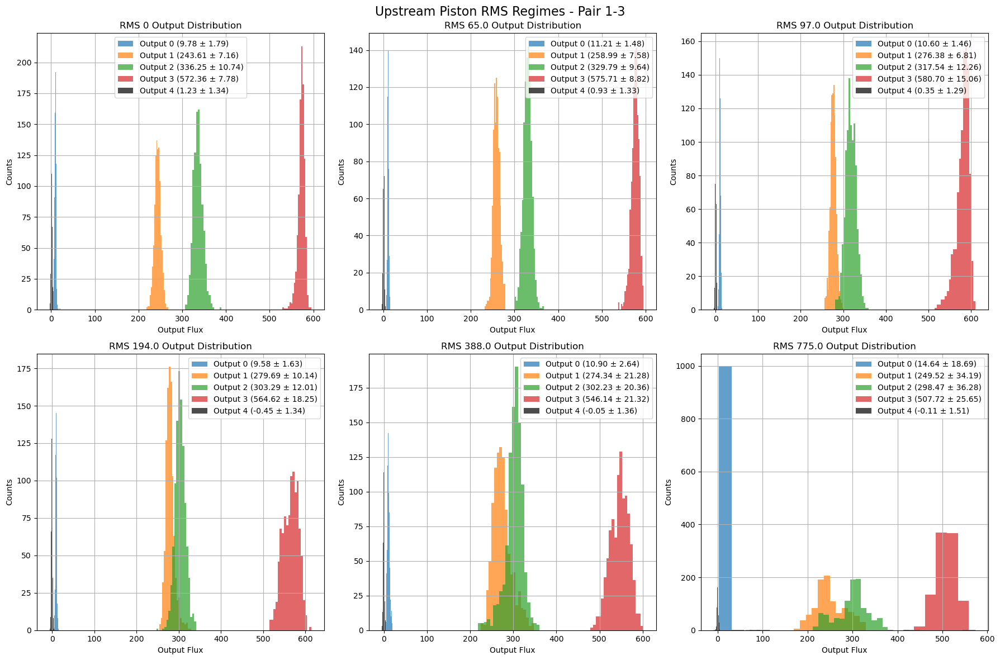

In [94]:
print('DM stabilisation time (s):', phobos.Config().get('dm.stabilization_time'))
print('TOPA stabilization time (s):', phobos.Config().get('photonic_chip.stabilization_time'))
use_topa = True
use_dm = True

if use_dm:
    text1 = '_with_dm'
else:
    text1 = ''

if use_topa:
    text2 = '_with_topa'
else:
    text2 = ''

res_rms_corrected2 = rms_scan(1000, rms_values, null_pos_topa, lam, pair, use_topa, True, use_dm, True)
chip.turn_off()
filename = 'fig_rms_corrected_pair_%s-%s%s%s_lam%s_useofphase2.png'%(pair[0], pair[1], text1, text2, light_lam)
res_rms_corrected2['figure'].savefig(path / filename)

filename = 'res_rms_corrected_pair_%s-%s%s%s_lam%s_useofphase2.pkl'%(pair[0], pair[1], text1, text2, light_lam)
with open(path / filename, 'wb') as f:
    pickle.dump(res_rms_corrected2, f)

DM stabilisation time (s): 0.002
TOPA stabilization time (s): 0.008
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Ref positions: [-1057.0, -1150.0]
Scanning RMS=387.5000 nm --- lambda/4.0000...


100%|██████████| 1000/1000 [04:54<00:00,  3.39it/s]


Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])


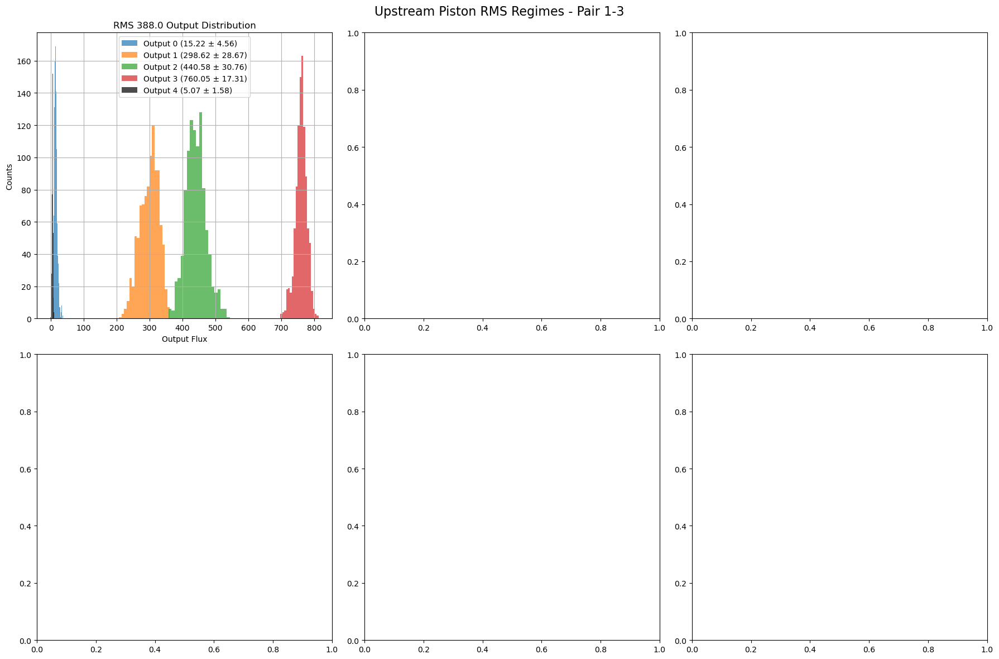

In [ ]:
# print('DM stabilisation time (s):', phobos.Config().get('dm.stabilization_time'))
# print('TOPA stabilization time (s):', phobos.Config().get('photonic_chip.stabilization_time'))
# use_topa = True
# use_dm = True

# if use_dm:
#     text1 = '_with_dm'
# else:
#     text1 = ''

# if use_topa:
#     text2 = '_with_topa'
# else:
#     text2 = ''

# res_rms_corrected = rms_scan(1000, rms_values, null_pos, lam, pair, use_topa, True, use_dm, False)
# chip.turn_off()
# filename = 'fig_rms_corrected_pair_%s-%s%s%s_useofphase2_2.png'%(pair[0], pair[1], text1, text2)
# res_rms_corrected['figure'].savefig(path / filename)

# filename = 'res_rms_corrected_pair_%s-%s%s%s_useofphase2_2.pkl'%(pair[0], pair[1], text1, text2)
# with open(path / filename, 'wb') as f:
#     pickle.dump(res_rms_corrected, f)

In [63]:
np.all(res_rms_corrected['data'][4.0]['dopd'] == res_rms_corrected2['data'][4.0]['dopd'])

np.True_

## With phase shifter alone

Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [1, 3] (segments [137, 135])
Ref positions: -1150.0
Scanning RMS=0.0000 nm --- 0 lambda


100%|██████████| 1000/1000 [04:58<00:00,  3.35it/s]


Scanning RMS=64.5833 nm --- lambda/24.0000...


100%|██████████| 1000/1000 [04:58<00:00,  3.36it/s]


Scanning RMS=96.8750 nm --- lambda/16.0000...


100%|██████████| 1000/1000 [04:58<00:00,  3.35it/s]


Scanning RMS=193.7500 nm --- lambda/8.0000...


100%|██████████| 1000/1000 [04:58<00:00,  3.35it/s]


Scanning RMS=387.5000 nm --- lambda/4.0000...


100%|██████████| 1000/1000 [04:58<00:00,  3.35it/s]


Scanning RMS=775.0000 nm --- lambda/2.0000...


100%|██████████| 1000/1000 [04:58<00:00,  3.35it/s]


Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


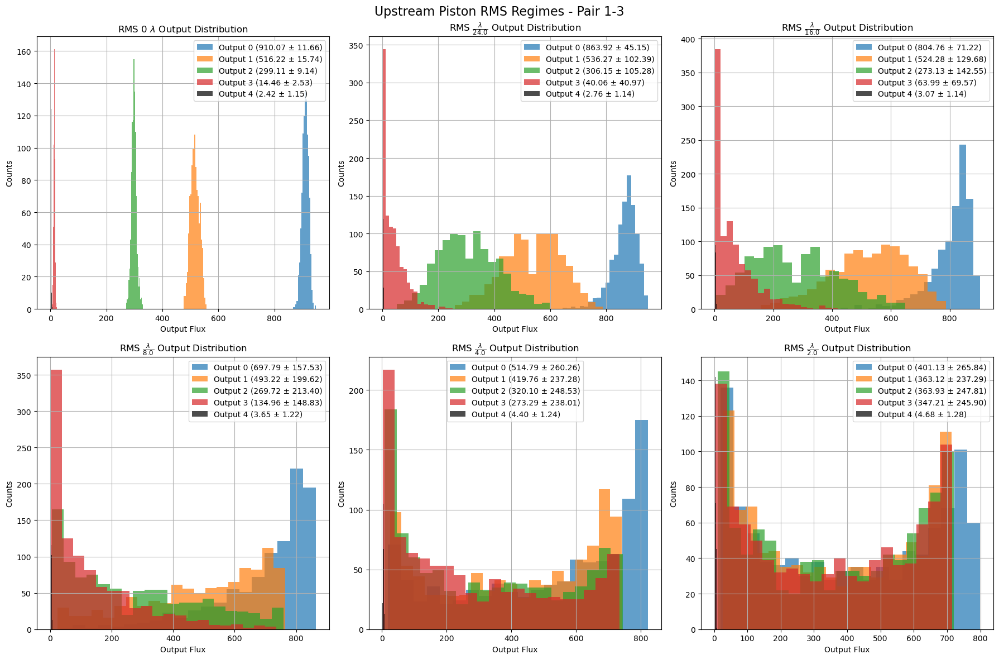

In [ ]:
use_topa = True
use_dm = False

if use_dm:
    text1 = '_with_dm'
else:
    text1 = ''

if use_topa:
    text2 = '_with_topa'
else:
    text2 = ''

res_rms_corrected = rms_scan(1000, rms_values[:], lam, pair, use_topa, True, use_dm)
filename = 'fig_rms_corrected_pair_%s-%s%s%s.png'%(pair[0], pair[1], text1, text2)
res_rms_corrected['figure'].savefig(path / filename)

filename = 'res_rms_corrected_pair_%s-%s%s%s.pkl'%(pair[0], pair[1], text1, text2)
with open(path / filename, 'wb') as f:
    pickle.dump(res_rms_corrected, f)

# Finding white light
## Scanning all pairs with different reference positions

Injection BALANCED on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


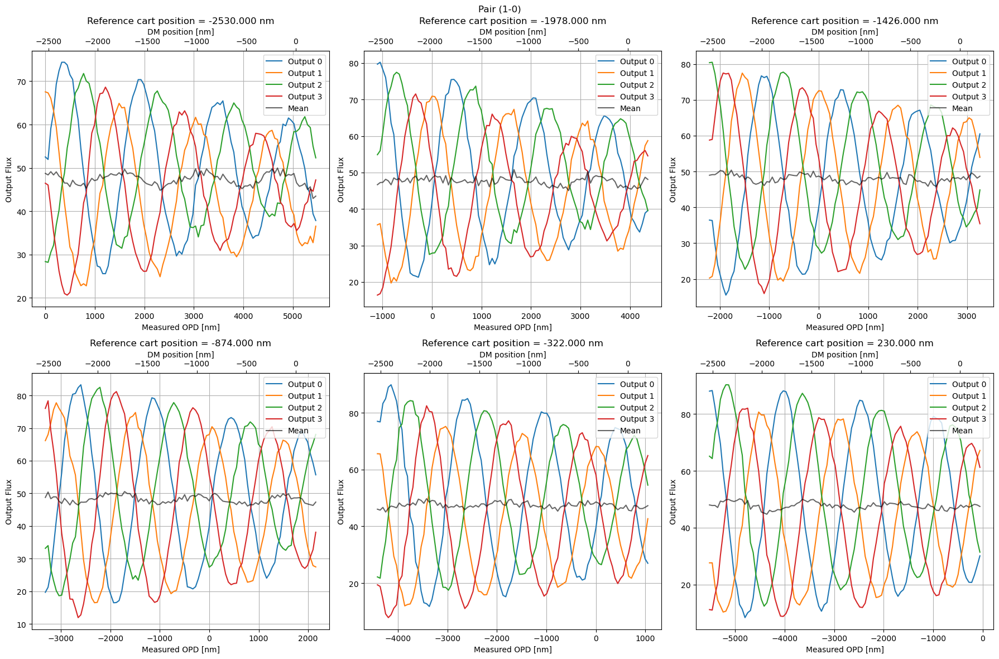

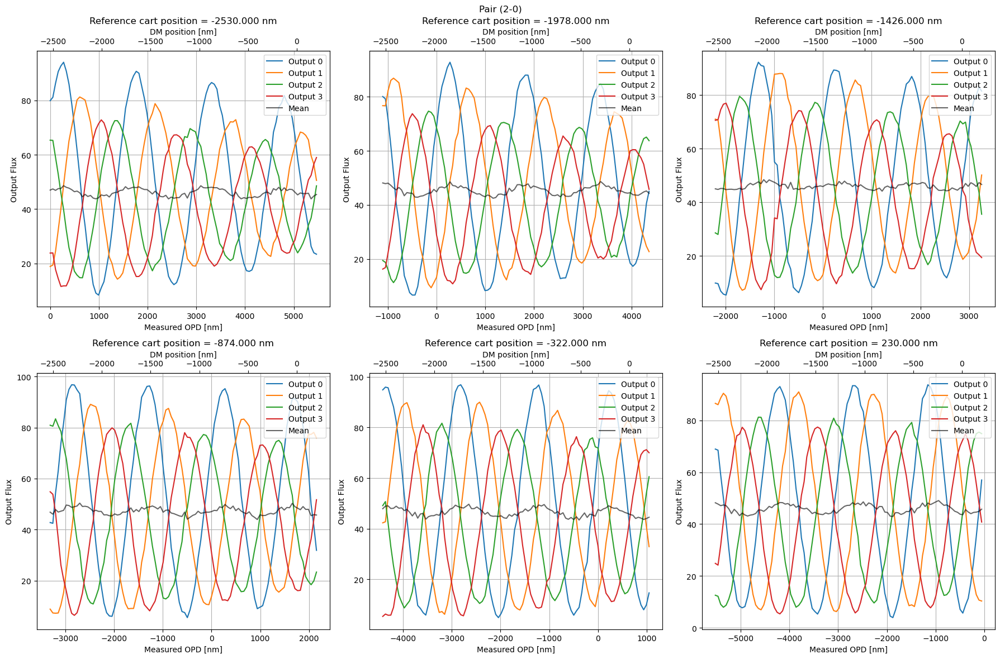

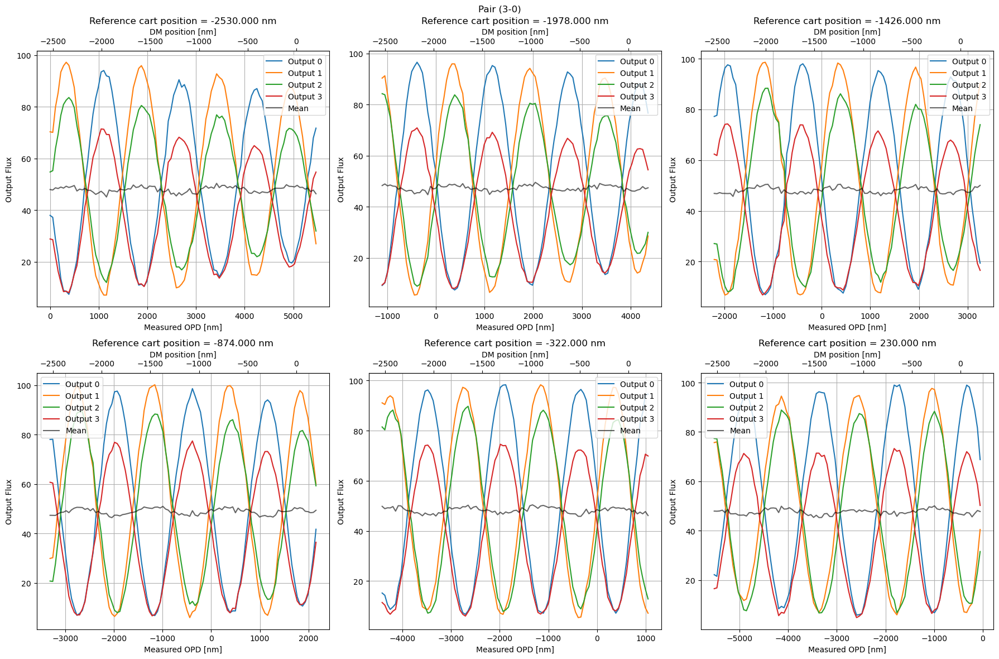

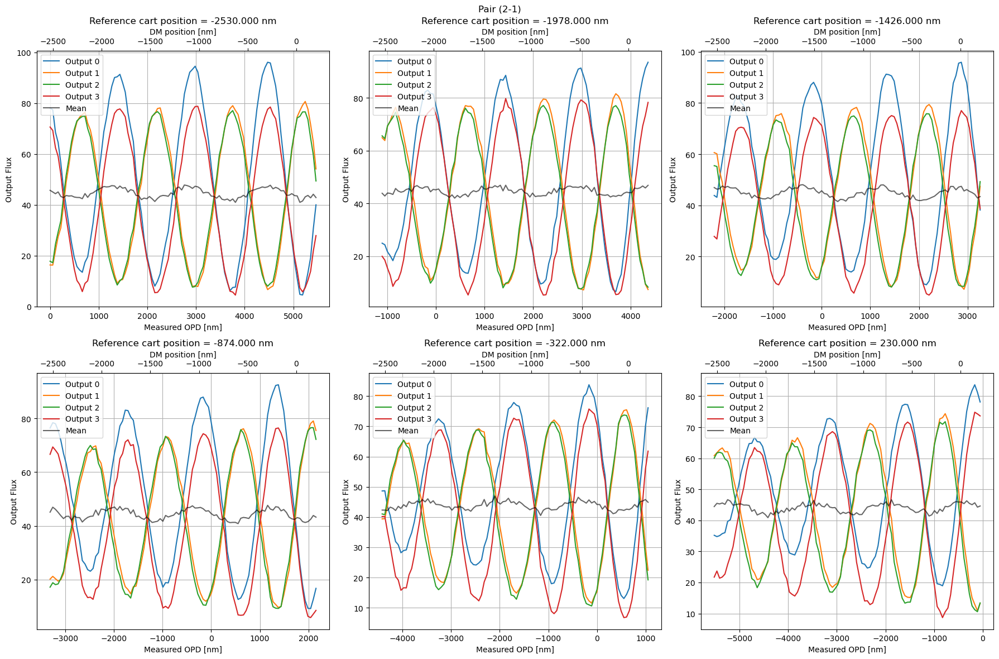

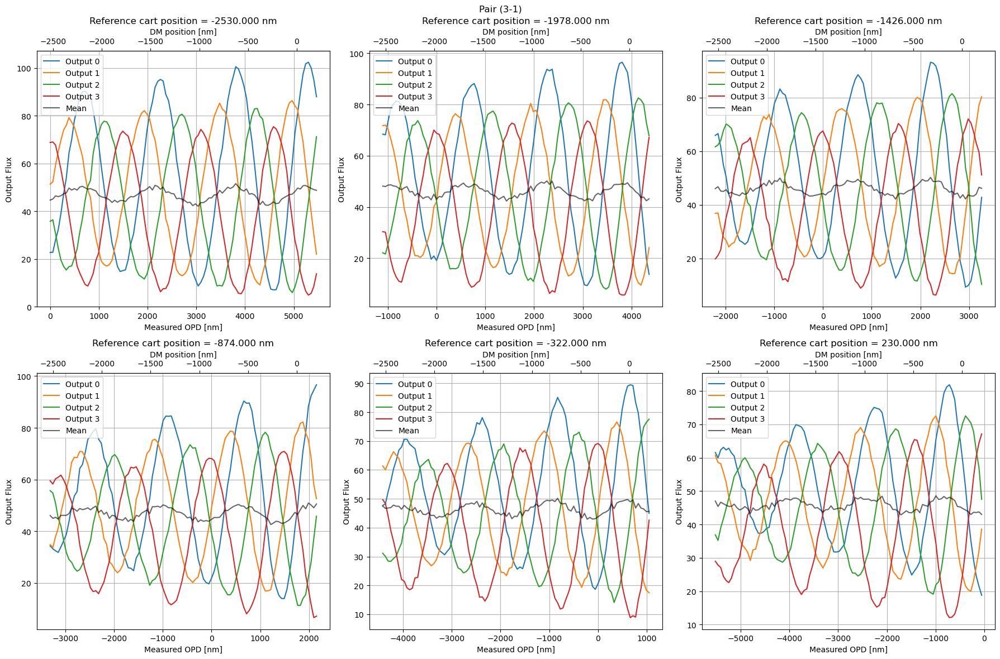

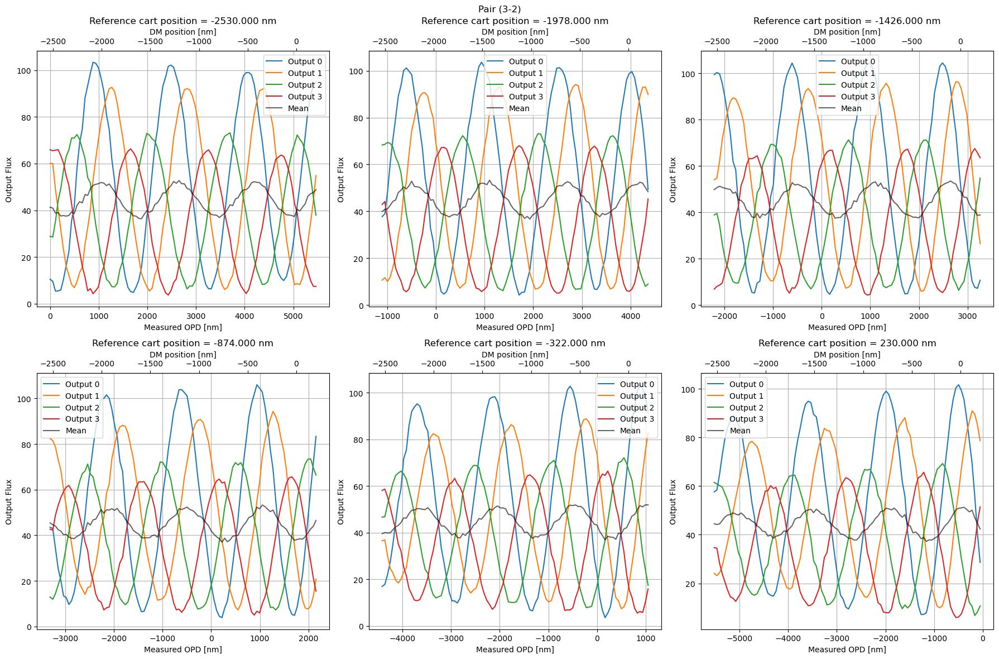

In [14]:
ref_positions = np.linspace(-2530, 230, 6)
pairs = [(1,0), (2,0), (3,0), (2,1), (3,1), (3,2)]
crop_mode = 'rectangles_integrated'
n_roi = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode).size - 1

for pair in pairs:
    res_pair_scan = {}

    fig, axs = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle(f'Pair ({pair[0]}-{pair[1]})')
    axs = axs.flatten()
    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
    for i, ref_cart in enumerate(ref_positions):
        inj.off(verbose=False)
        inj.set_balanced(np.array(pair), verbose=False)

        ref_tip = (dm[inj_seg[pair[0]]].get_tip(), dm[inj_seg[pair[1]]].get_tip())
        ref_tilt = (dm[inj_seg[pair[0]]].get_tilt(), dm[inj_seg[pair[1]]].get_tilt())

        dm[inj_seg[pair[1]]].set_ptt(ref_cart, ref_tip[1], ref_tilt[1])
        piston_range = np.linspace(-2530, 230, 100, endpoint=False)  # [nm]
        opd_range = (piston_range - ref_cart) * 2

        # Scan on first input
        outs = np.empty((len(piston_range), n_roi))
        for p, piston in enumerate(piston_range):
            dm[inj_seg[pair[0]]].set_ptt(piston, ref_tip[0], ref_tilt[0])
            if p == 0:
                time.sleep(0.1)
            outs[p] = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode)[:n_roi]

        dm[inj_seg[pair[0]]].set_ptt(ref_cart, ref_tip[0], ref_tilt[0]) # Re-init segment
        time.sleep(0.1)

        data = np.hstack((opd_range[:,None], outs.copy()))
        data = np.hstack((piston_range[:,None], data.copy()))
        res_pair_scan[ref_cart] = data

        for o in range(n_roi):
            axs[i].plot(opd_range, outs[:, o], color=colors[o], label=f'Output {o}')
        axs[i].plot(opd_range, outs.mean(1), color='k', linestyle='-', alpha=0.6, label='Mean')

        axs[i].set_title(f'Reference cart position = {ref_cart:.3f} nm')
        axs[i].set_xlabel('Measured OPD [nm]')
        axs[i].set_ylabel('Output Flux')
        axs[i].legend()
        axs[i].grid()
        opd_to_piston = lambda opd, rc=ref_cart: opd / 2.0 + rc
        piston_to_opd = lambda piston, rc=ref_cart: (piston - rc) * 2.0
        secax = axs[i].secondary_xaxis('top', functions=(opd_to_piston, piston_to_opd))
        secax.set_xlabel('DM position [nm]')

    fig.tight_layout()
    filename = 'dm_scan_white_light_pair_%d_%d.png'%(pair[0], pair[1])
    fig.savefig(path / filename, dpi=150, format='png')

    filename = 'dm_scan_white_light_pair_%d_%d.pkl'%(pair[0], pair[1])
    with open(path / filename, 'wb') as f:
        pickle.dump(res_pair_scan, f)


inj.set_balanced()

## Going to the white light on one good pair

In [89]:
def scan_dm_white_light(start, end, nstack, n_roi):
    inj.off()
    inj.set_balanced(np.array(pair))

    ref_tip = (dm[inj_seg[pair[0]]].get_tip(), dm[inj_seg[pair[1]]].get_tip())
    ref_tilt = (dm[inj_seg[pair[0]]].get_tilt(), dm[inj_seg[pair[1]]].get_tilt())

    dm[inj_seg[pair[1]]].set_ptt(ref_cart, ref_tip[1], ref_tilt[1])
    piston_range = np.linspace(start, end, 100, endpoint=True)  # [nm]
    opd_range = (piston_range - ref_cart) * 2

    # Scan on first input
    outs = np.empty((len(piston_range), n_roi))
    spectral_outs = np.empty((len(piston_range), n_roi, spectral_sz))
    for p, piston in enumerate(tqdm(piston_range)):
        dm[inj_seg[pair[0]]].set_ptt(piston, ref_tip[0], ref_tilt[0])
        if p == 0:
            time.sleep(0.1)
        frame = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode, stack=nstack)[:n_roi]
        outs[p] = frame.mean(1)
        spectral_outs[p] = frame

    dm[inj_seg[pair[0]]].set_ptt(ref_cart, ref_tip[0], ref_tilt[0]) # Re-init segment
    time.sleep(0.1)

    max_bright_pos = piston_range[np.argmax(outs[:,3])]
    max_null_pos = piston_range[np.argmax(outs[:,0])]
    min_bright_pos = piston_range[np.argmin(outs[:,3])]
    min_null_pos = piston_range[np.argmin(outs[:,0])]

    print('Max flux for output 3:', max_bright_pos)
    print('Max flux for output 0:', max_null_pos)
    print('Min flux for output 3:', min_bright_pos)
    print('Min flux for output 0:', min_null_pos)

    inj.off()
    inj.set_balanced(np.array(pair))
    dm[inj_seg[pair[0]]].set_ptt(max_bright_pos, ref_tip[0], ref_tilt[0])
    dm[inj_seg[pair[1]]].set_ptt(ref_cart, ref_tip[1], ref_tilt[1])

    positions = (max_bright_pos, max_null_pos, min_bright_pos, min_null_pos)

    return outs, spectral_outs, positions, piston_range, opd_range

def run_scan(pair, ref_cart, start, end, spec_law, nstack, suffix):
    crop_mode = 'rectangles'
    shapes = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode).shape 
    n_roi = shapes[0]
    crop_areas = np.array(phobos.Config().get('cred3.output_rectangles'))
    crop_areas = crop_areas[:n_roi-1]
    crop_areas = crop_areas[:,[0,2]] # Got the spectral bounds of each track
    spectral_axs = np.array([np.arange(crop_areas[i,0], crop_areas[i,-1]) for i in range(crop_areas.shape[0])])
    spectral_axs = np.array([np.polyval(spec_law[i], spectral_axs[i]) for i in range(spectral_axs.shape[0])])

    outs, spectral_outs, positions, piston_range, opd_range = scan_dm_white_light(start, end, nstack=nstack, n_roi=n_roi)
    filename = f'opd0_dm_scan_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_range_{int(start)}_{int(end)}nm{suffix}.npz'
    np.savez(path / filename, 
            data=outs, 
            spectral_data=spectral_outs, 
            ref_cart=ref_cart, 
            piston_range=piston_range, 
            opd_range=opd_range)
    print('Data saved in', path / filename)

    return outs, spectral_outs, positions, piston_range, opd_range, spectral_axs

### Coarse scan

In [90]:
nstack = 100
suffix = f'_nstack{nstack}'

In [91]:
chip.turn_off()
ref_cart = 230
start, end = -2230, 230
spec_law = np.load(path / 'spec_cal_coeffs_and_errors.npy')[0]

pair = (2,0)
crop_mode = 'rectangles'
shapes = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode).shape 
n_roi = shapes[0] - 1
spectral_sz = shapes[1]

outs, spectral_outs, positions, piston_range, opd_range, spectral_axs = run_scan(pair, ref_cart, start, end, spec_law, nstack, suffix)

max_bright_pos, max_null_pos, min_bright_pos, min_null_pos = positions


Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [2, 0] (segments [136, 138])


100%|██████████| 100/100 [00:50<00:00,  1.98it/s]

Max flux for output 3: -1509.3939393939395
Max flux for output 0: -1136.6666666666667
Min flux for output 3: -1906.969696969697
Min flux for output 0: -739.0909090909092
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [2, 0] (segments [136, 138])
Data saved in /mnt/disk1/archive/2026-08-17_347a303/2_2T_charac/opd0_dm_scan_pair_2-0_ref_230nm_range_-2230_230nm_nstack100.npz


In [92]:
inj.off()
inj.set_balanced(np.array(pair))
dm[inj_seg[pair[0]]].set_ptt(max_bright_pos, ref_tip[0], ref_tilt[0])
dm[inj_seg[pair[1]]].set_ptt(ref_cart, ref_tip[1], ref_tilt[1])

Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [2, 0] (segments [136, 138])


0

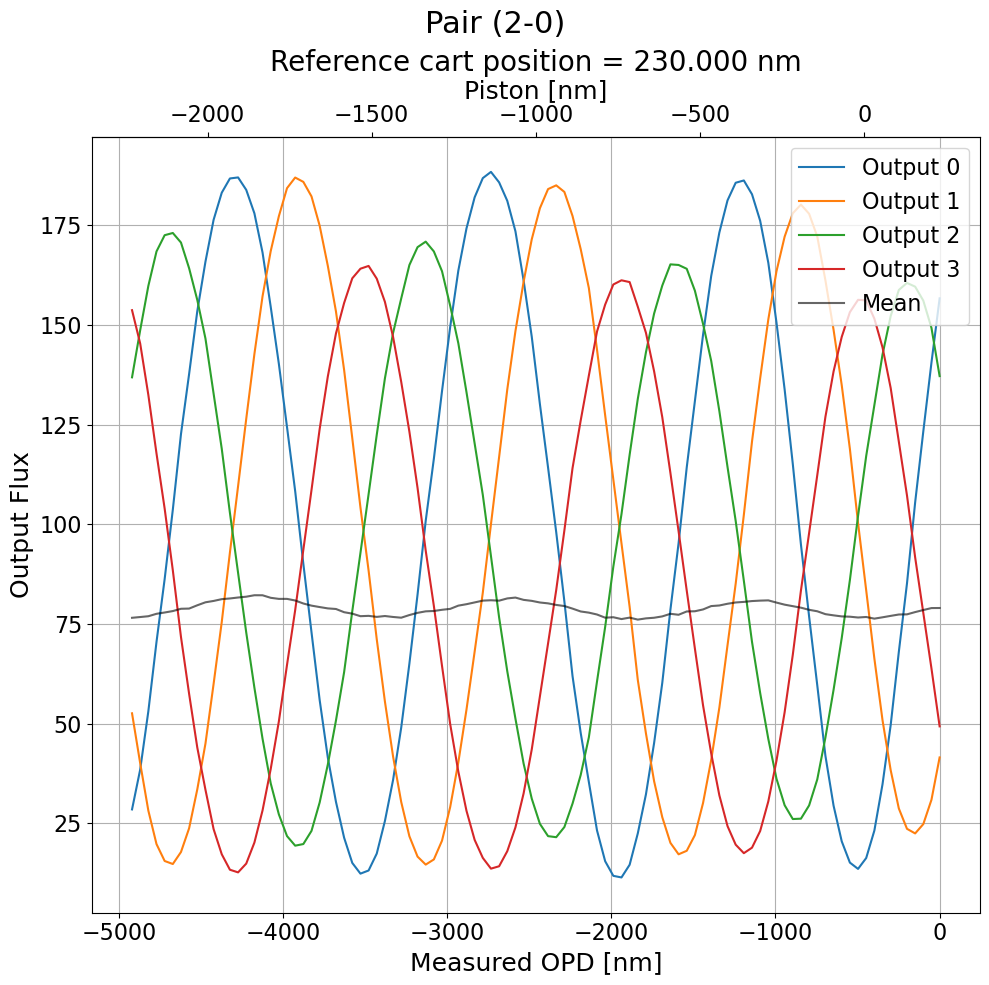

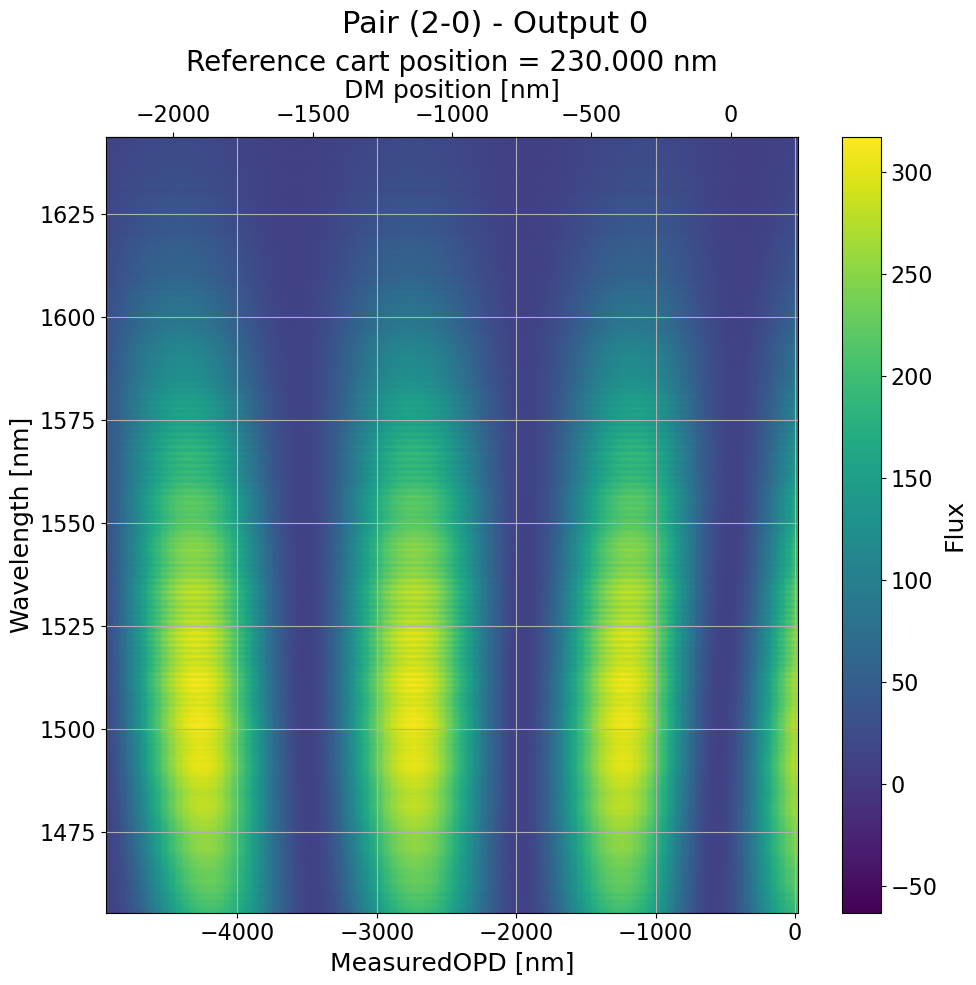

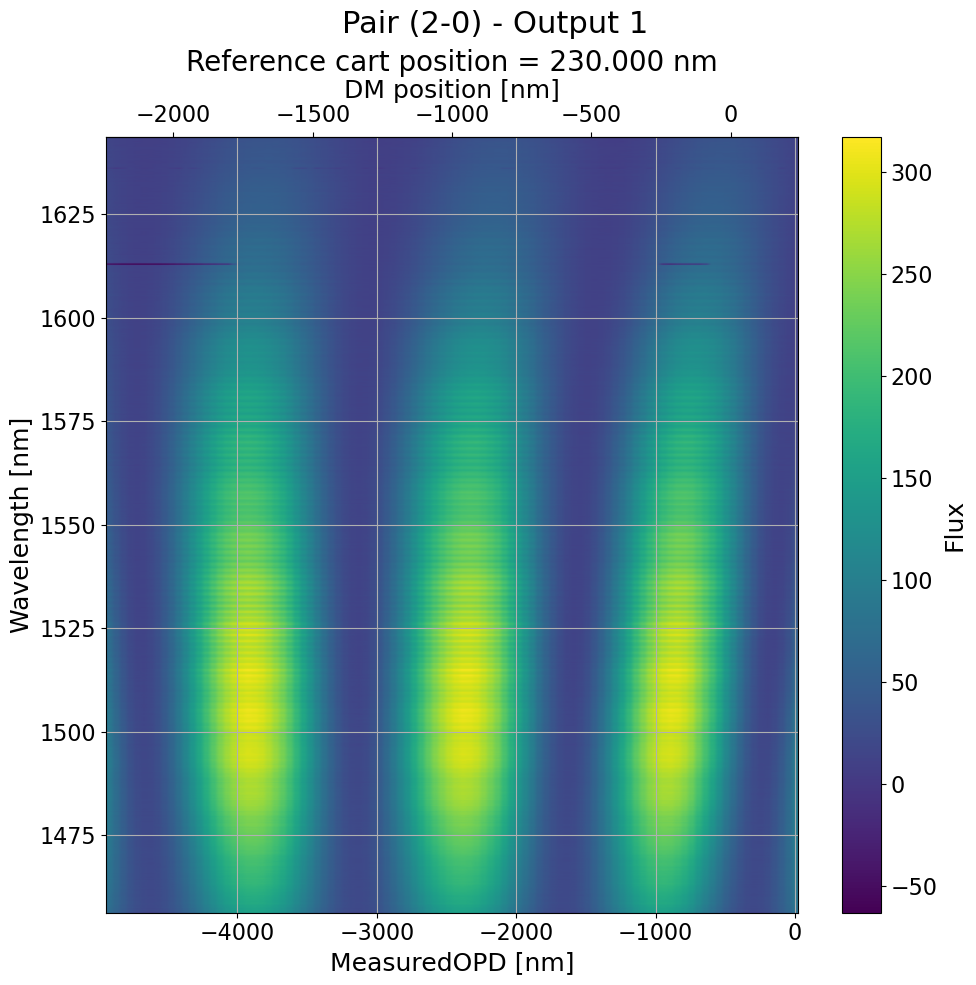

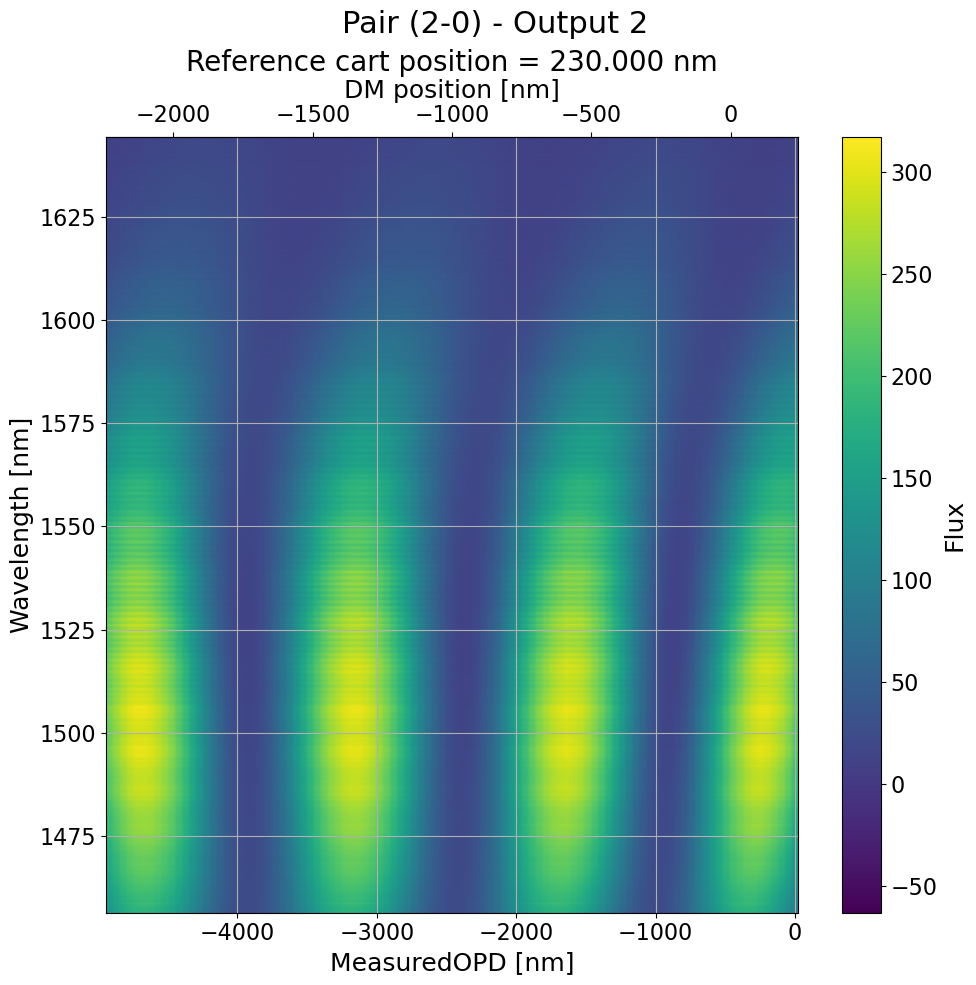

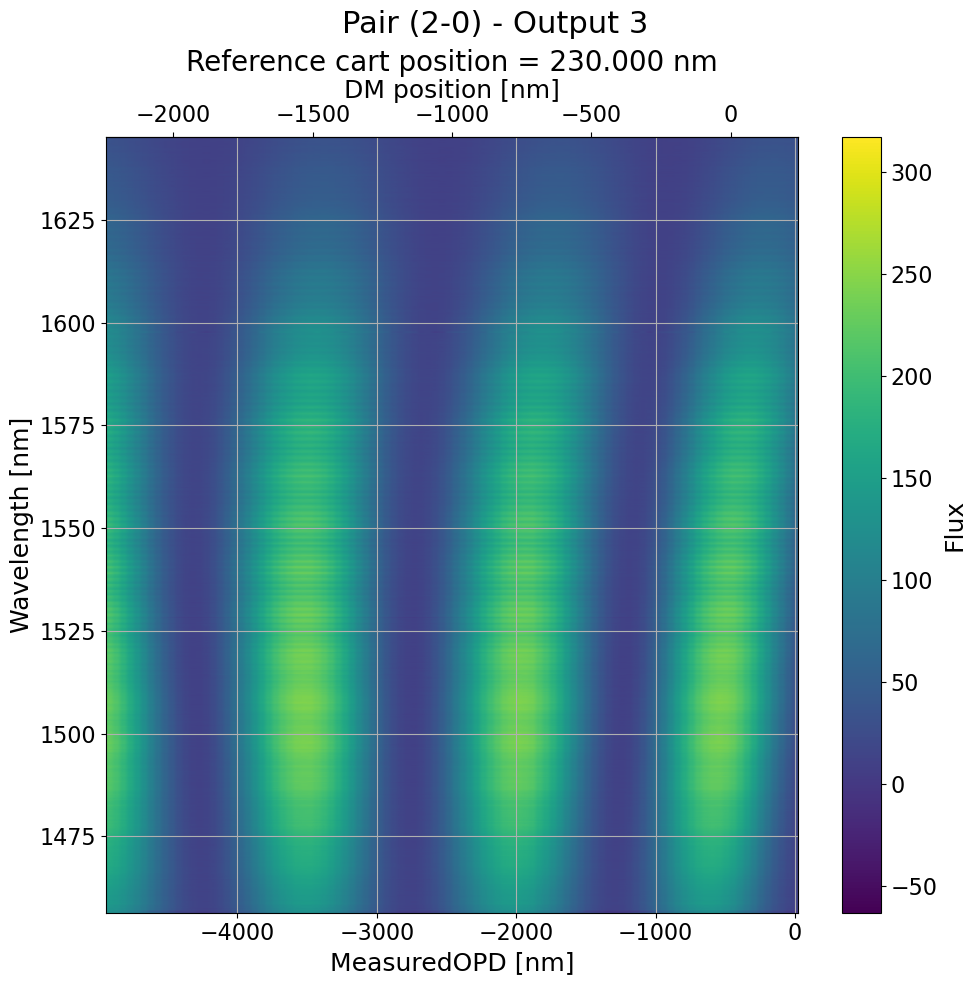

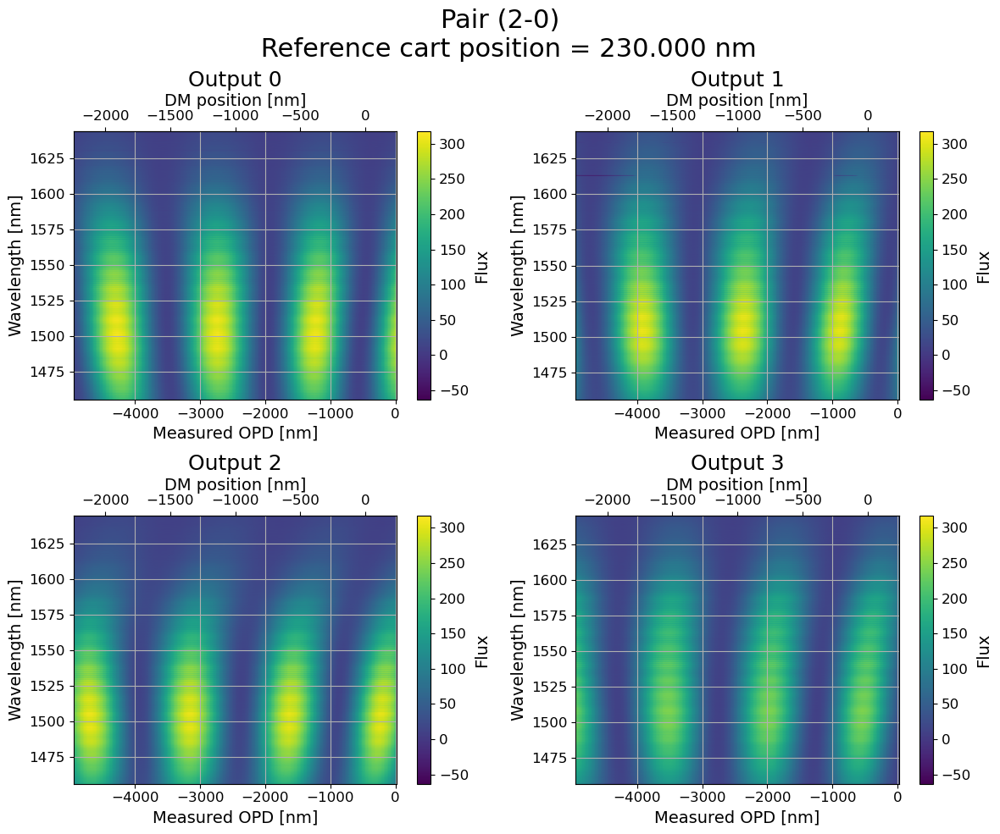

In [93]:
# Plot integrated flux
opd_step = opd_range[1] - opd_range[0]

suptitle_fs = 22
title_fs = 20
label_fs = 18
tick_fs = 16
legend_fs = 16
fig, axs = plt.subplots(1, 1, figsize=(10, 10))
fig.suptitle(f'Pair ({pair[0]}-{pair[1]})', fontsize=suptitle_fs)
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
for o in range(n_roi):
    axs.plot(opd_range, outs[:, o], color=colors[o], label=f'Output {o}')
axs.plot(opd_range, outs.mean(1), color='k', linestyle='-', alpha=0.6, label='Mean')
axs.tick_params(labelsize=tick_fs)
axs.set_title(f'Reference cart position = {ref_cart:.3f} nm', fontsize=title_fs)
axs.set_xlabel('Measured OPD [nm]', fontsize=label_fs)
axs.set_ylabel('Output Flux', fontsize=label_fs)
axs.legend(loc='upper right', fontsize=legend_fs)
axs.grid()
opd_to_piston = lambda opd, rc=ref_cart: opd / 2.0 + rc
piston_to_opd = lambda piston, rc=ref_cart: (piston - rc) * 2.0
secax = axs.secondary_xaxis('top', functions=(opd_to_piston, piston_to_opd))
secax.set_xlabel('Piston [nm]', fontsize=label_fs)
secax.tick_params(labelsize=tick_fs)
fig.tight_layout()
filename = f'opd0_dm_scan_coarse_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_range_{int(piston_range[0])}_{int(piston_range[-1])}nm.png'
fig.savefig(path / filename, dpi=300, format='png')

# Plot maps
for k in range(4):
    fig, axs = plt.subplots(1, 1, figsize=(10, 10))
    fig.suptitle(f'Pair ({pair[0]}-{pair[1]}) - Output {k}', fontsize=suptitle_fs)
    im = axs.imshow(spectral_outs[:,k,:].T, aspect='auto', origin='lower', 
                    extent=[opd_range.min() - opd_step/2, opd_range.max() + opd_step/2, 
                            spectral_axs[k,0]-spec_law[k,0]/2, spectral_axs[k,-1]+spec_law[k,0]/2],
                    vmin = spectral_outs.min(),
                    vmax = spectral_outs.max())
    axs.tick_params(labelsize=tick_fs)
    axs.set_title(f'Reference cart position = {ref_cart:.3f} nm', fontsize=title_fs)
    axs.set_xlabel('MeasuredOPD [nm]', fontsize=label_fs)
    axs.set_ylabel('Wavelength [nm]', fontsize=label_fs)
    axs.grid()
    cbar = fig.colorbar(im, ax=axs)
    cbar.set_label('Flux', fontsize=label_fs)
    cbar.ax.tick_params(labelsize=tick_fs)
    secax = axs.secondary_xaxis('top', functions=(opd_to_piston, piston_to_opd))
    secax.set_xlabel('DM position [nm]', fontsize=label_fs)
    secax.tick_params(labelsize=tick_fs)
    fig.tight_layout()
    filename = f'opd0_dm_scan_coarse_spectral_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_range_{int(piston_range[0])}_{int(piston_range[-1])}nm_output{k}{suffix}.png'
    fig.savefig(path / filename, dpi=300, format='png')

# Plot maps in a single figure
suptitle_fs = 22
title_fs = 18
label_fs = 14
tick_fs = 12
legend_fs = 12

fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()
fig.suptitle(
    f'Pair ({pair[0]}-{pair[1]}) \n Reference cart position = {ref_cart:.3f} nm',
    fontsize=suptitle_fs,
)
for o in range(4):
    im = axs[o].imshow(
        spectral_outs[:, o, :].T,
        aspect='auto',
        origin='lower',
        extent=[
            opd_range.min() - opd_step / 2,
            opd_range.max() + opd_step / 2,
            spectral_axs[o,0]-spec_law[o,0]/2, 
            spectral_axs[o,-1]+spec_law[o,0]/2,
        ],
        vmin = spectral_outs.min(),
        vmax = spectral_outs.max()
    )
    axs[o].tick_params(labelsize=tick_fs)
    axs[o].set_title(f'Output {o}', fontsize=title_fs)
    axs[o].set_xlabel('Measured OPD [nm]', fontsize=label_fs)
    axs[o].set_ylabel('Wavelength [nm]', fontsize=label_fs)
    axs[o].grid()

    # Add colorbar attached to the current subplot
    cbar = fig.colorbar(im, ax=axs[o])
    cbar.set_label('Flux', fontsize=label_fs)
    cbar.ax.tick_params(labelsize=tick_fs)

    secax = axs[o].secondary_xaxis('top', functions=(opd_to_piston, piston_to_opd))
    secax.set_xlabel('DM position [nm]', fontsize=label_fs)
    secax.tick_params(labelsize=tick_fs)

fig.tight_layout()
filename = f'opd0_dm_scan_coarse_spectral_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_range_{int(piston_range[0])}_{int(piston_range[-1])}nm{suffix}.png'
fig.savefig(path / filename, dpi=300, format='png')

### Fine scan

In [109]:
ref_cart = 230
start, end = max_bright_pos - lam / 4, max_bright_pos + lam / 4

spec_law = np.load(path / 'spec_cal_coeffs_and_errors.npy')[0]

pair = (2,0)
crop_mode = 'rectangles'
shapes = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode).shape 
n_roi = shapes[0]
spectral_sz = shapes[1]

outs2, spectral_outs2, positions2, piston_range2, opd_range2, spectral_axs2 = run_scan(pair, ref_cart, start, end, spec_law, nstack, suffix)

max_bright_pos2, max_null_pos2, min_bright_pos2, min_null_pos2 = positions2


Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [2, 0] (segments [136, 138])


  0%|          | 0/100 [00:00<?, ?it/s]

  8%|▊         | 8/100 [00:04<00:50,  1.81it/s]


KeyboardInterrupt: 

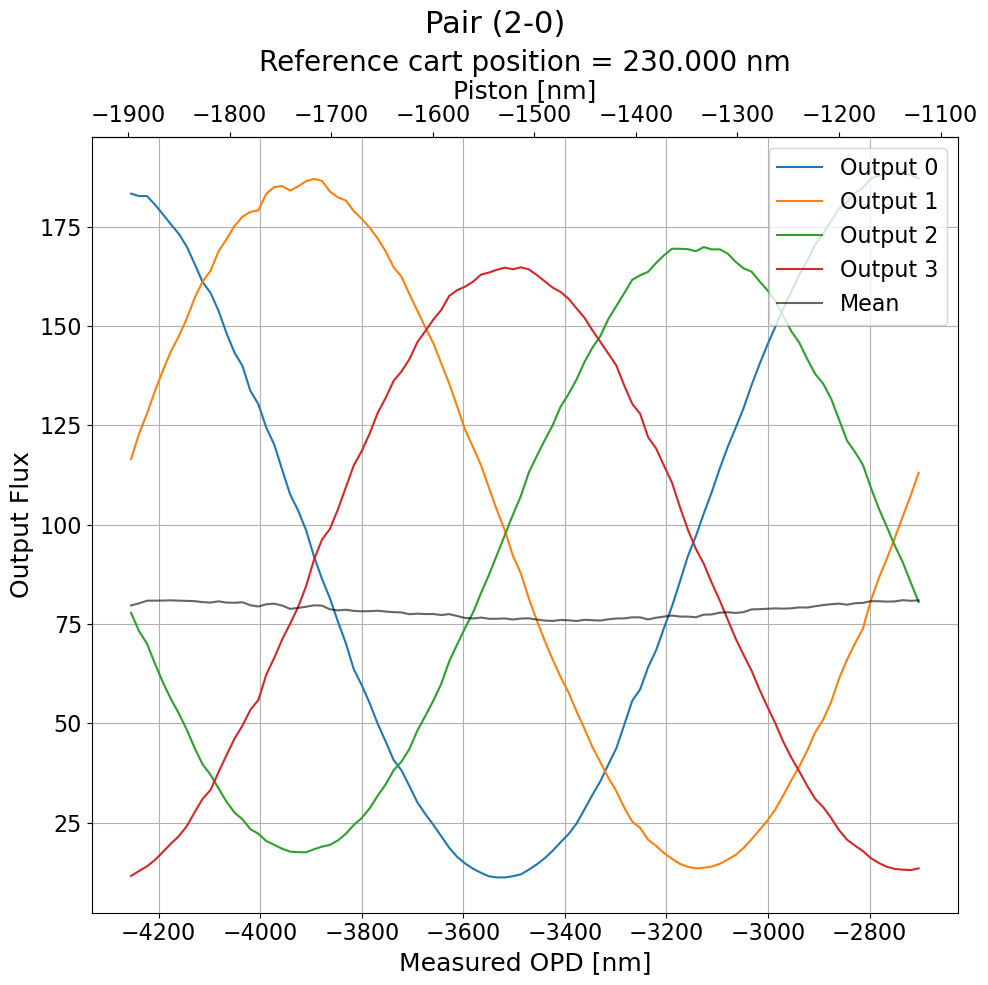

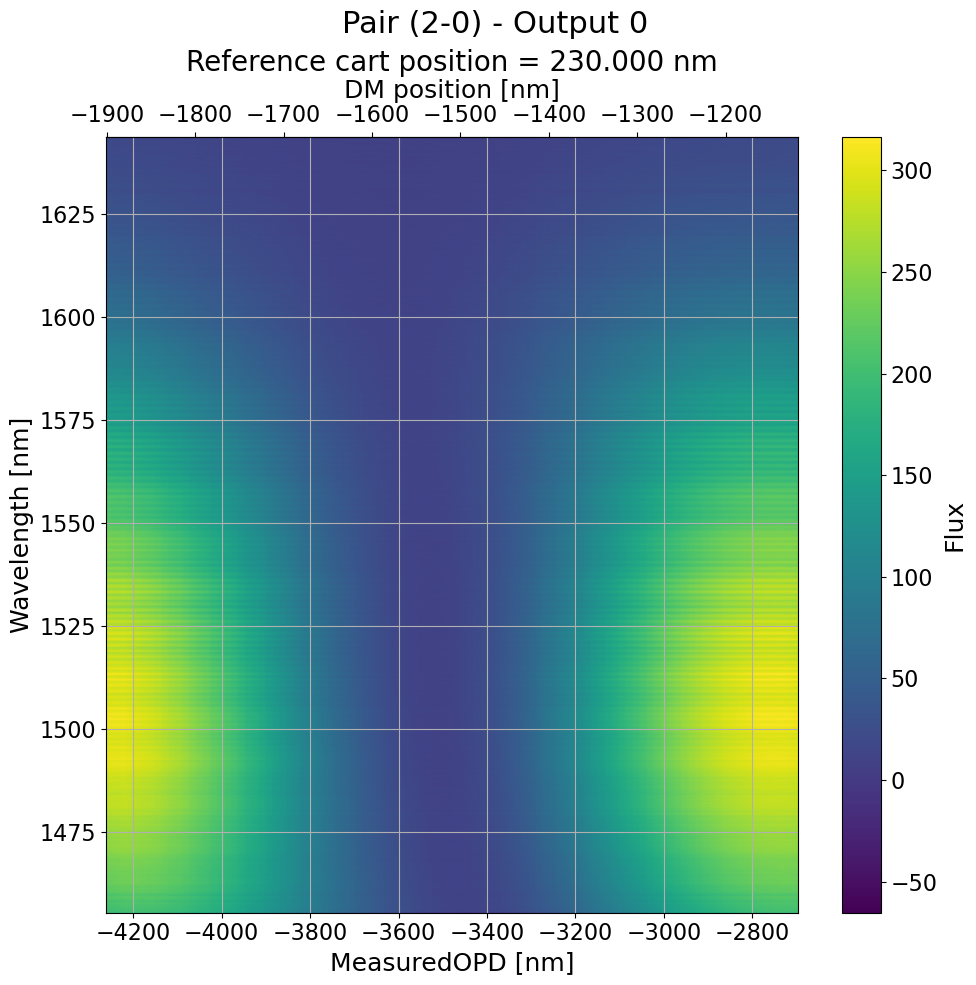

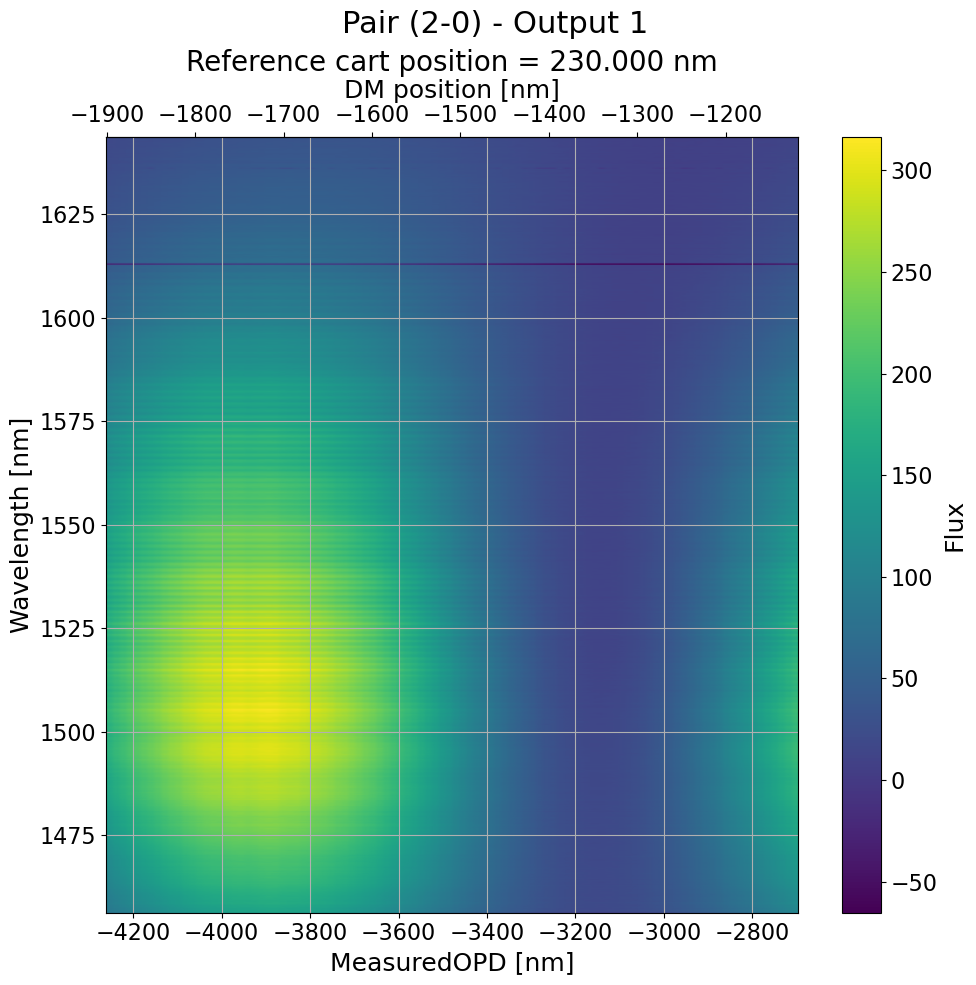

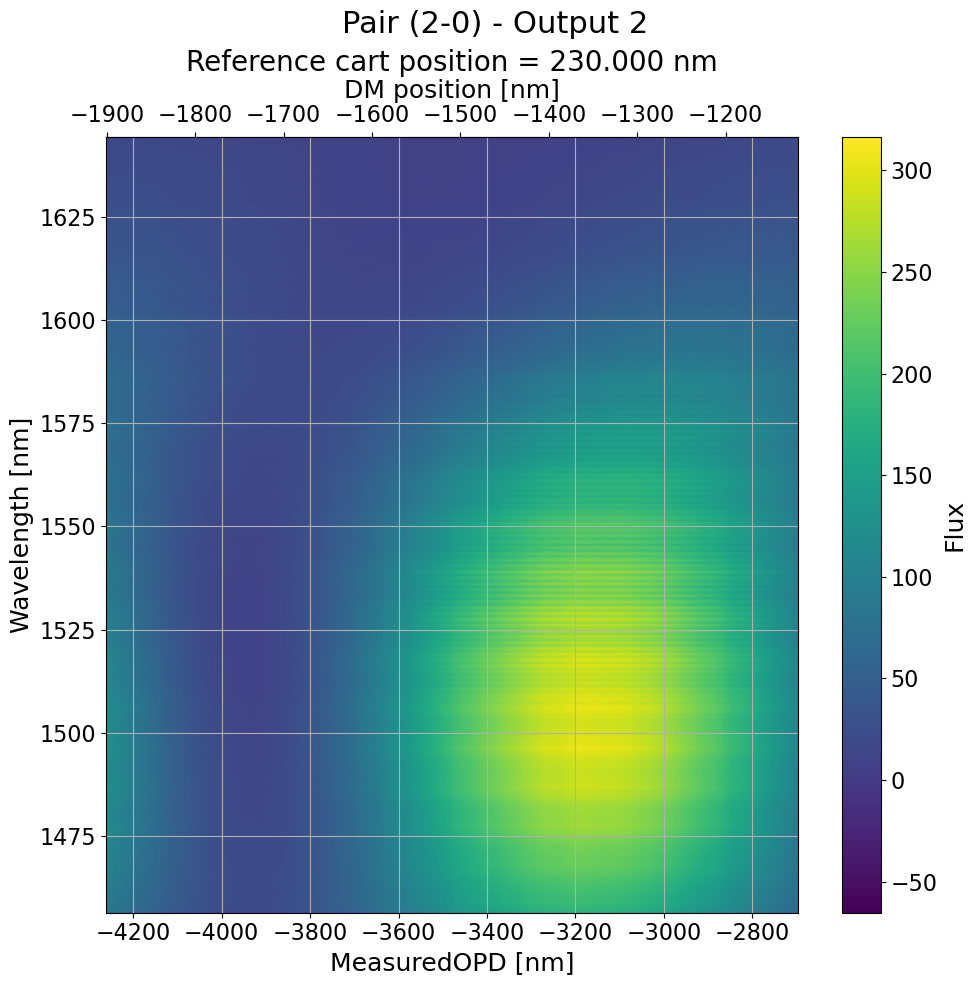

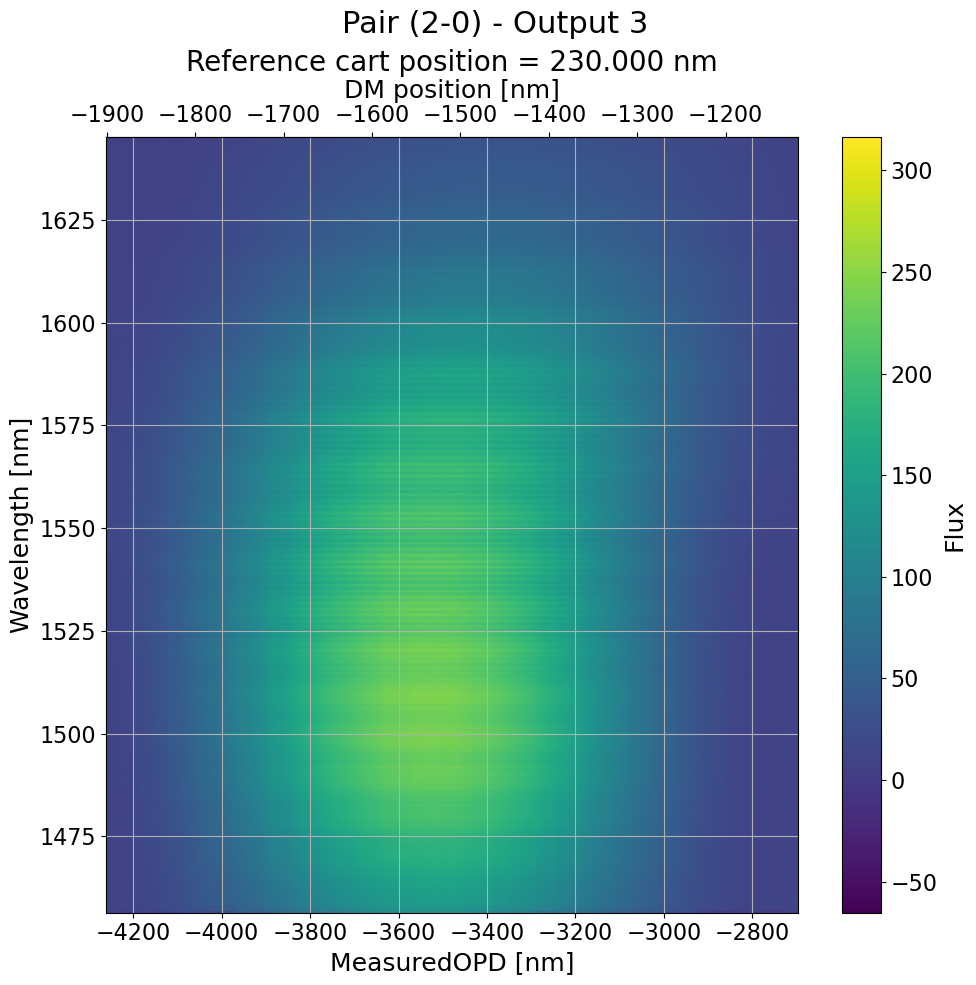

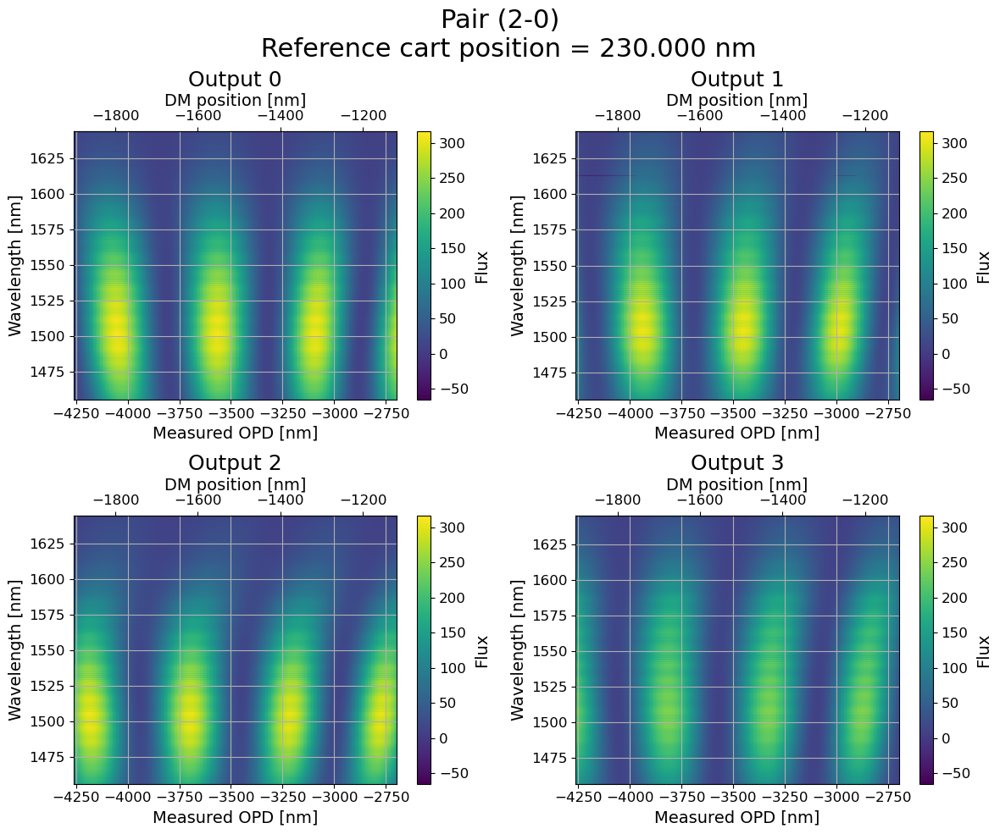

In [95]:
# Plot integrated flux
opd_step2 = opd_range2[1] - opd_range2[0]

suptitle_fs = 22
title_fs = 20
label_fs = 18
tick_fs = 16
legend_fs = 16
fig, axs = plt.subplots(1, 1, figsize=(10, 10))
fig.suptitle(f'Pair ({pair[0]}-{pair[1]})', fontsize=suptitle_fs)
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
for o in range(n_roi-1):
    axs.plot(opd_range2, outs2[:, o], color=colors[o], label=f'Output {o}')
axs.plot(opd_range2, outs2.mean(1), color='k', linestyle='-', alpha=0.6, label='Mean')
axs.tick_params(labelsize=tick_fs)
axs.set_title(f'Reference cart position = {ref_cart:.3f} nm', fontsize=title_fs)
axs.set_xlabel('Measured OPD [nm]', fontsize=label_fs)
axs.set_ylabel('Output Flux', fontsize=label_fs)
axs.legend(loc='upper right', fontsize=legend_fs)
axs.grid()
opd_to_piston = lambda opd, rc=ref_cart: opd / 2.0 + rc
piston_to_opd = lambda piston, rc=ref_cart: (piston - rc) * 2.0
secax = axs.secondary_xaxis('top', functions=(opd_to_piston, piston_to_opd))
secax.set_xlabel('Piston [nm]', fontsize=label_fs)
secax.tick_params(labelsize=tick_fs)
fig.tight_layout()
filename = f'opd0_dm_scan_fine_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_range_{int(piston_range2[0])}_{int(piston_range2[-1])}nm{suffix}.png'
fig.savefig(path / filename, dpi=300, format='png')

# Plot maps
for k in range(4):
    fig, axs = plt.subplots(1, 1, figsize=(10, 10))
    fig.suptitle(f'Pair ({pair[0]}-{pair[1]}) - Output {k}', fontsize=suptitle_fs)
    im = axs.imshow(spectral_outs2[:,k,:].T, aspect='auto', origin='lower', 
                    extent=[opd_range2.min() - opd_step2/2, opd_range2.max() + opd_step2/2, 
                            spectral_axs[k,0]-spec_law[k,0]/2, spectral_axs[k,-1]+spec_law[k,0]/2],
                    vmin = spectral_outs2.min(),
                    vmax = spectral_outs2.max())
    axs.tick_params(labelsize=tick_fs)
    axs.set_title(f'Reference cart position = {ref_cart:.3f} nm', fontsize=title_fs)
    axs.set_xlabel('MeasuredOPD [nm]', fontsize=label_fs)
    axs.set_ylabel('Wavelength [nm]', fontsize=label_fs)
    axs.grid()
    cbar = fig.colorbar(im, ax=axs)
    cbar.set_label('Flux', fontsize=label_fs)
    cbar.ax.tick_params(labelsize=tick_fs)
    secax = axs.secondary_xaxis('top', functions=(opd_to_piston, piston_to_opd))
    secax.set_xlabel('DM position [nm]', fontsize=label_fs)
    secax.tick_params(labelsize=tick_fs)
    fig.tight_layout()
    filename = f'opd0_dm_scan_fine_spectral_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_range_{int(piston_range2[0])}_{int(piston_range2[-1])}nm_output{k}{suffix}.png'
    fig.savefig(path / filename, dpi=300, format='png')

# Plot maps in a single figure
suptitle_fs = 22
title_fs = 18
label_fs = 14
tick_fs = 12
legend_fs = 12

fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()
fig.suptitle(
    f'Pair ({pair[0]}-{pair[1]}) \n Reference cart position = {ref_cart:.3f} nm',
    fontsize=suptitle_fs,
)
for o in range(4):
    im = axs[o].imshow(
        spectral_outs[:, o, :].T,
        aspect='auto',
        origin='lower',
        extent=[
            opd_range2.min() - opd_step2 / 2,
            opd_range2.max() + opd_step2 / 2,
            spectral_axs[o,0]-spec_law[o,0]/2, 
            spectral_axs[o,-1]+spec_law[o,0]/2,
        ],
        vmin = spectral_outs2.min(),
        vmax = spectral_outs2.max()
    )
    axs[o].tick_params(labelsize=tick_fs)
    axs[o].set_title(f'Output {o}', fontsize=title_fs)
    axs[o].set_xlabel('Measured OPD [nm]', fontsize=label_fs)
    axs[o].set_ylabel('Wavelength [nm]', fontsize=label_fs)
    axs[o].grid()

    # Add colorbar attached to the current subplot
    cbar = fig.colorbar(im, ax=axs[o])
    cbar.set_label('Flux', fontsize=label_fs)
    cbar.ax.tick_params(labelsize=tick_fs)

    secax = axs[o].secondary_xaxis('top', functions=(opd_to_piston, piston_to_opd))
    secax.set_xlabel('DM position [nm]', fontsize=label_fs)
    secax.tick_params(labelsize=tick_fs)

fig.tight_layout()
filename = f'opd0_dm_scan_fine_spectral_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_range_{int(piston_range2[0])}_{int(piston_range2[-1])}nm{suffix}.png'
fig.savefig(path / filename, dpi=300, format='png')

## Scanning the TOPA around OPD0

Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [2, 0] (segments [136, 138])
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [2, 0] (segments [136, 138])


100%|██████████| 100/100 [00:50<00:00,  1.98it/s]


Max flux for output 3: -1516.2481060606062
Max flux for output 0: -1147.102272727273
Min flux for output 3: -1923.5814393939395
Min flux for output 0: -1528.977272727273
Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [2, 0] (segments [136, 138])
0-OPD at: -1509.3939393939395 and -1516.2481060606062 nm


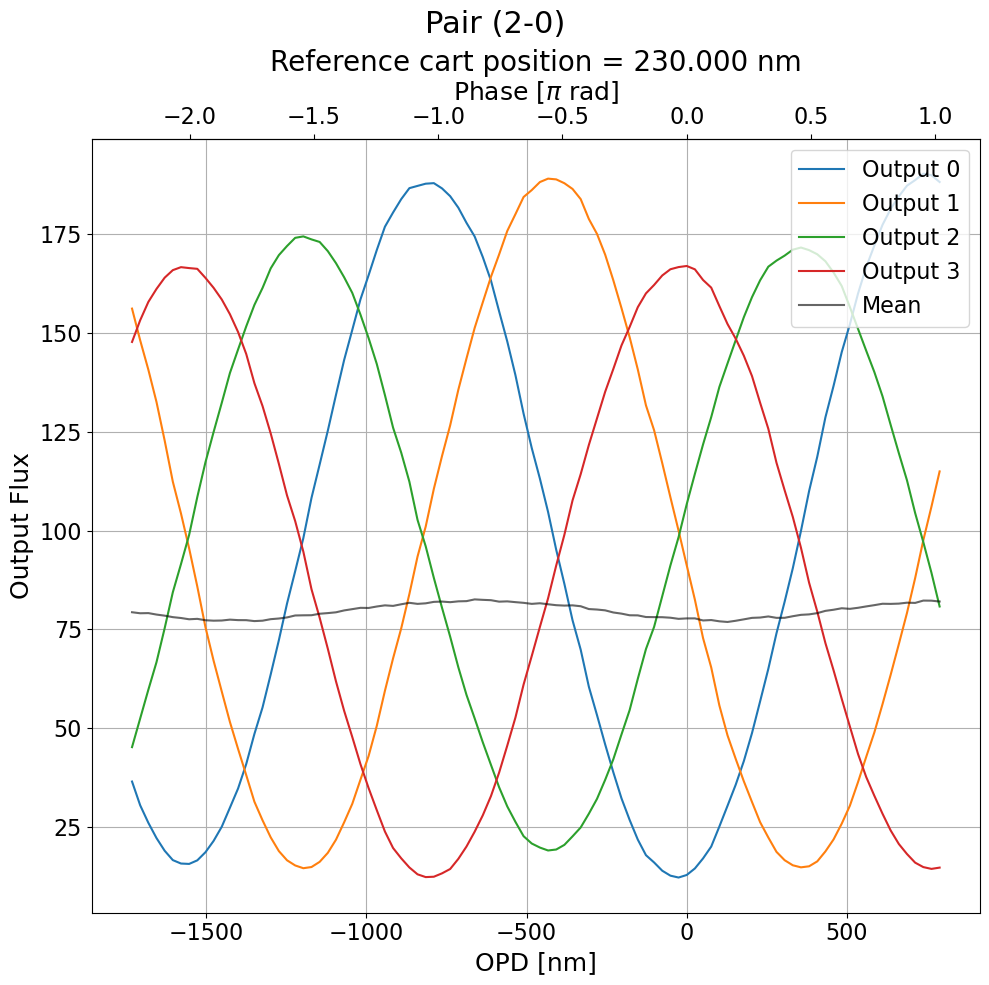

In [96]:
# We scan the same fringes with the DM in the range of the TOPA
inj.off()
inj.set_balanced(np.array(pair))

end = min(230, max_bright_pos + lam / 4)
start = end - 6.5/8 * lam
dm[inj_seg[pair[0]]].set_ptt(start, ref_tip[0], ref_tilt[0])
dm[inj_seg[pair[1]]].set_ptt(ref_cart, ref_tip[1], ref_tilt[1])

outs3, spectral_outs3, positions3, piston_range3, opd_range3 = scan_dm_white_light(start, end, nstack=nstack, n_roi=5)

max_bright_pos3, max_null_pos3, min_bright_pos3, min_null_pos3 = positions3

filename = f'opd0_topa_dm_scan_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}_pos_{int(np.around(end))}{suffix}.npz'
np.savez(path / filename, data=outs3, spectral_data=spectral_outs3, ref_cart=ref_cart, piston_range=piston_range3, opd0=max_bright_pos3)

print('0-OPD at:', max_bright_pos, 'and', max_bright_pos3, 'nm')

# Plot integrated flux
opd_range3 = (piston_range3 - max_bright_pos3) * 2
opd_step3 = opd_range3[1] - opd_range3[0]

suptitle_fs = 22
title_fs = 20
label_fs = 18
tick_fs = 16
legend_fs = 16
n_roi = 4
fig, axs = plt.subplots(1, 1, figsize=(10, 10))
fig.suptitle(f'Pair ({pair[0]}-{pair[1]})', fontsize=suptitle_fs)
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
for o in range(n_roi):
    axs.plot(opd_range3, outs3[:, o], color=colors[o], label=f'Output {o}')
axs.plot(opd_range3, outs3.mean(1), color='k', linestyle='-', alpha=0.6, label='Mean')
axs.tick_params(labelsize=tick_fs)
axs.set_title(f'Reference cart position = {ref_cart:.3f} nm', fontsize=title_fs)
axs.set_xlabel('OPD [nm]', fontsize=label_fs)
axs.set_ylabel('Output Flux', fontsize=label_fs)
axs.legend(loc='upper right', fontsize=legend_fs)
axs.grid()
opd_to_phase = lambda opd, wl=lam: 2 / wl * opd
phase_to_opd = lambda ph, wl=lam: wl / (2) * ph
secax = axs.secondary_xaxis('top', functions=(opd_to_phase, phase_to_opd))
secax.set_xlabel(r'Phase [$\pi$ rad]', fontsize=label_fs)
secax.tick_params(labelsize=tick_fs)
fig.tight_layout()
filename = f'opd0_topa_dm_scan_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_range_{int(piston_range3[0])}_{int(piston_range3[-1])}nm{suffix}.png'
fig.savefig(path / filename, dpi=300, format='png')

In [97]:
# When power increase, the phase decreases (direction opposite from DM piston variation)
inj.off()
inj.set_balanced(np.array(pair))
n_roi = 5

dm[inj_seg[pair[0]]].set_ptt(end, ref_tip[0], ref_tilt[0])
dm[inj_seg[pair[1]]].set_ptt(ref_cart, ref_tip[1], ref_tilt[1])

power_ramp, power_step = np.linspace(0, 1, 100, retstep=True)
data = np.empty((len(power_ramp), n_roi))
spectral_data = np.empty((len(power_ramp), n_roi, spectral_sz))
phases = np.empty_like(power_ramp)

for idx, p in enumerate(tqdm(power_ramp)):
    powers = np.zeros((len(chip.shifters),))
    powers[pair[0]] = p
    chip.set_powers(powers)
    frame = cam.get_outputs(flux_mode='mean', crop_mode=crop_mode, stack=nstack)
    data[idx] = frame.mean(1)
    spectral_data[idx] = frame
    phases[idx] = chip.get_phases()[pair[0]]

chip.turn_off()

filename = f'opd0_topa_scan_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}_start_{int(np.around(start))}_range_{int(power_ramp[0])}_{int(power_ramp[-1])}W{suffix}.npz'
np.savez(path / filename, data=data, spectral_data=spectral_data, phases=phases, power_ramp=power_ramp)
print('Data saved in', path / filename)

max_bright_pos4 = power_ramp[np.argmax(data[:,3])]
max_null_pos4 = power_ramp[np.argmax(data[:,0])]
min_bright_pos4 = power_ramp[np.argmin(data[:,3])]
min_null_pos4 = power_ramp[np.argmin(data[:,0])]

print('Max flux for output 3:', max_bright_pos4)
print('Max flux for output 0:', max_null_pos4)
print('Min flux for output 3:', min_bright_pos4)
print('Min flux for output 0:', min_null_pos4)


Injection OFF on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])
Injection BALANCED on channels [2, 0] (segments [136, 138])


  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [01:04<00:00,  1.54it/s]

Data saved in /mnt/disk1/archive/2026-08-17_347a303/2_2T_charac/opd0_topa_scan_pair_2-0_ref_230_start_-2382_range_0_1W_nstack100.npz
Max flux for output 3: 0.29292929292929293
Max flux for output 0: 0.0
Min flux for output 3: 0.5656565656565657
Min flux for output 0: 0.2828282828282829


In [ ]:
powers[pair[0]] = 0.6
chip.set_powers(powers)


In [108]:
chip.turn_off()


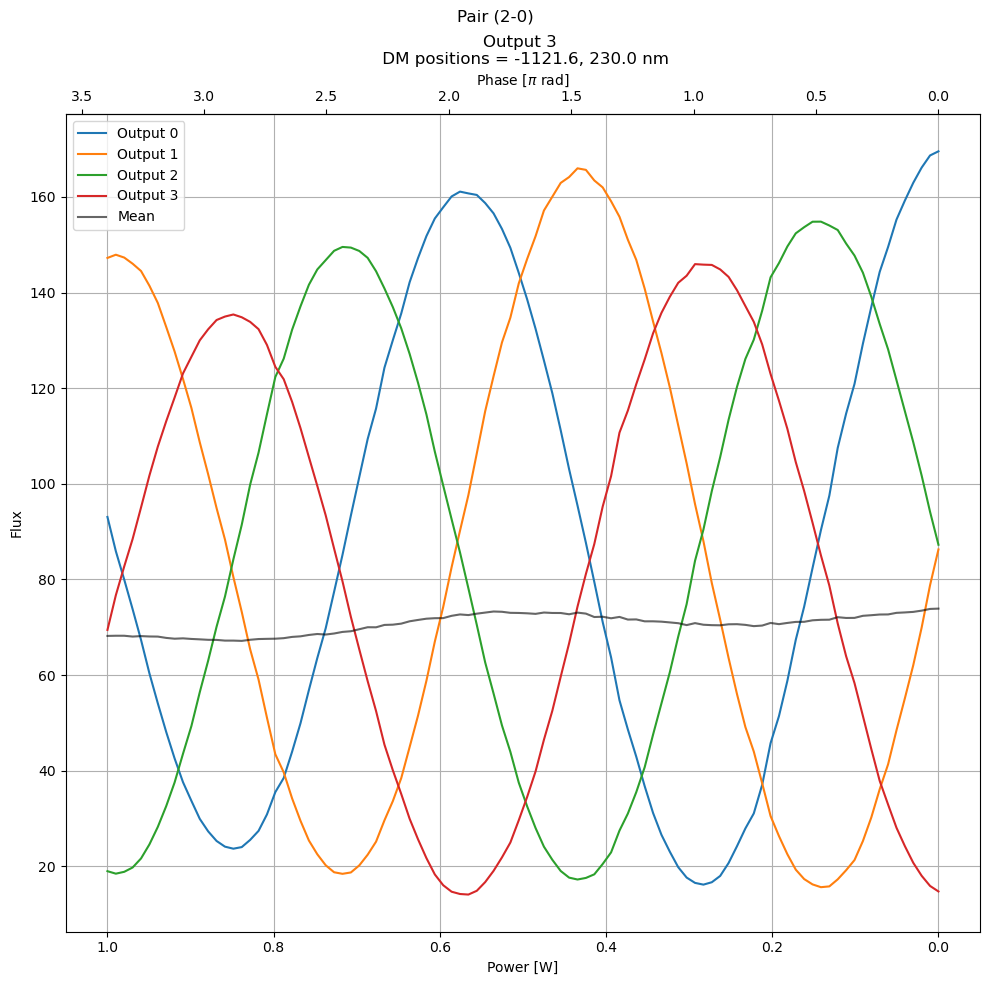

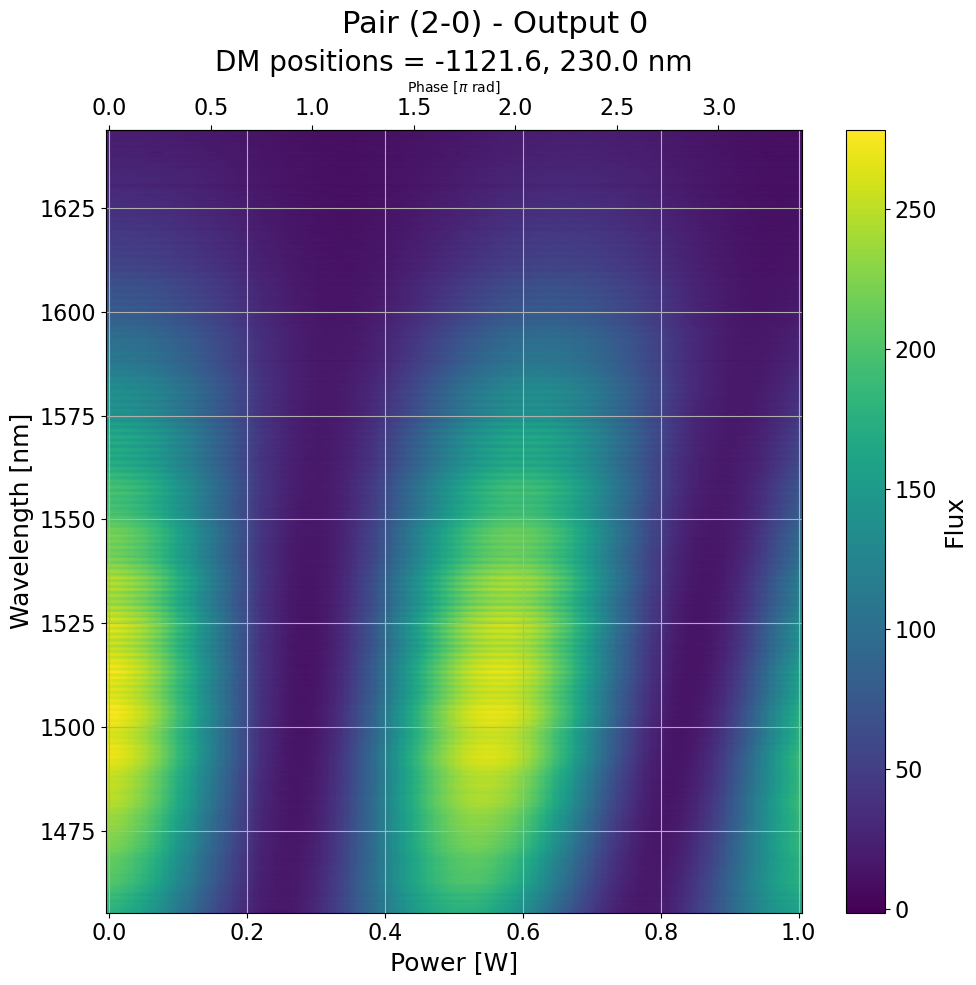

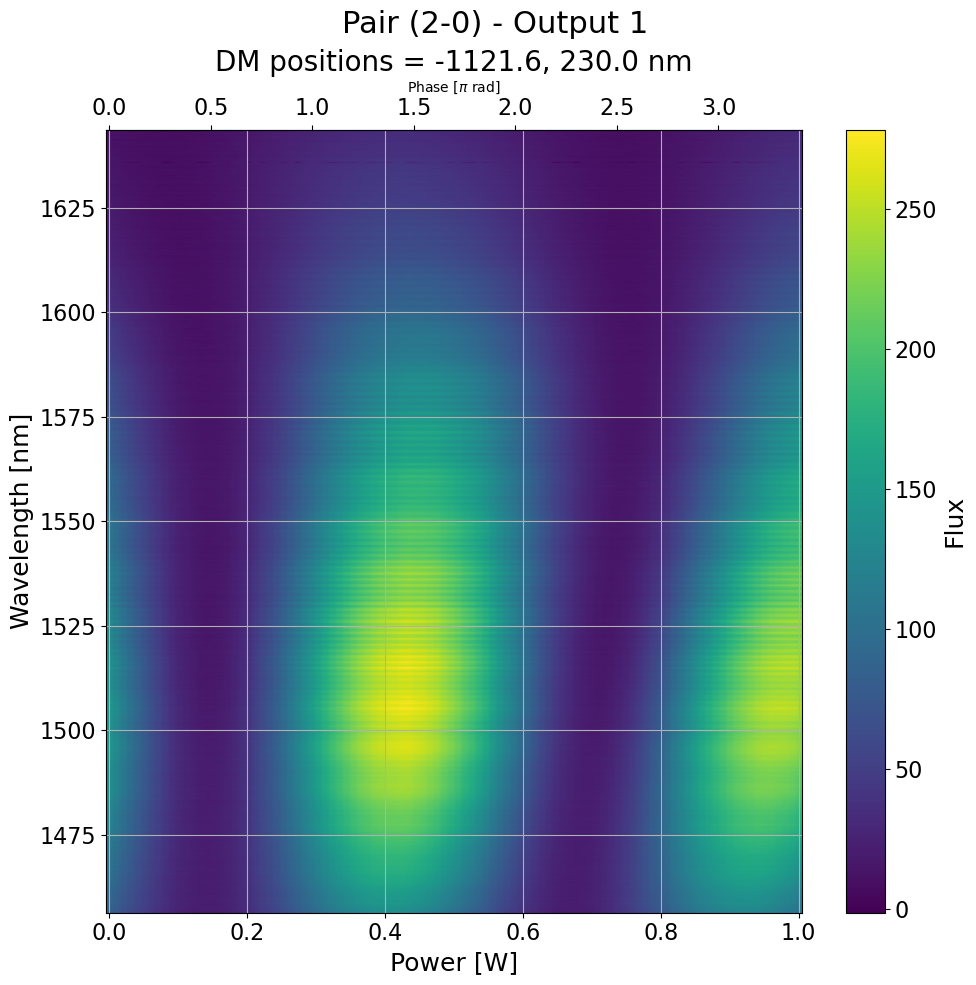

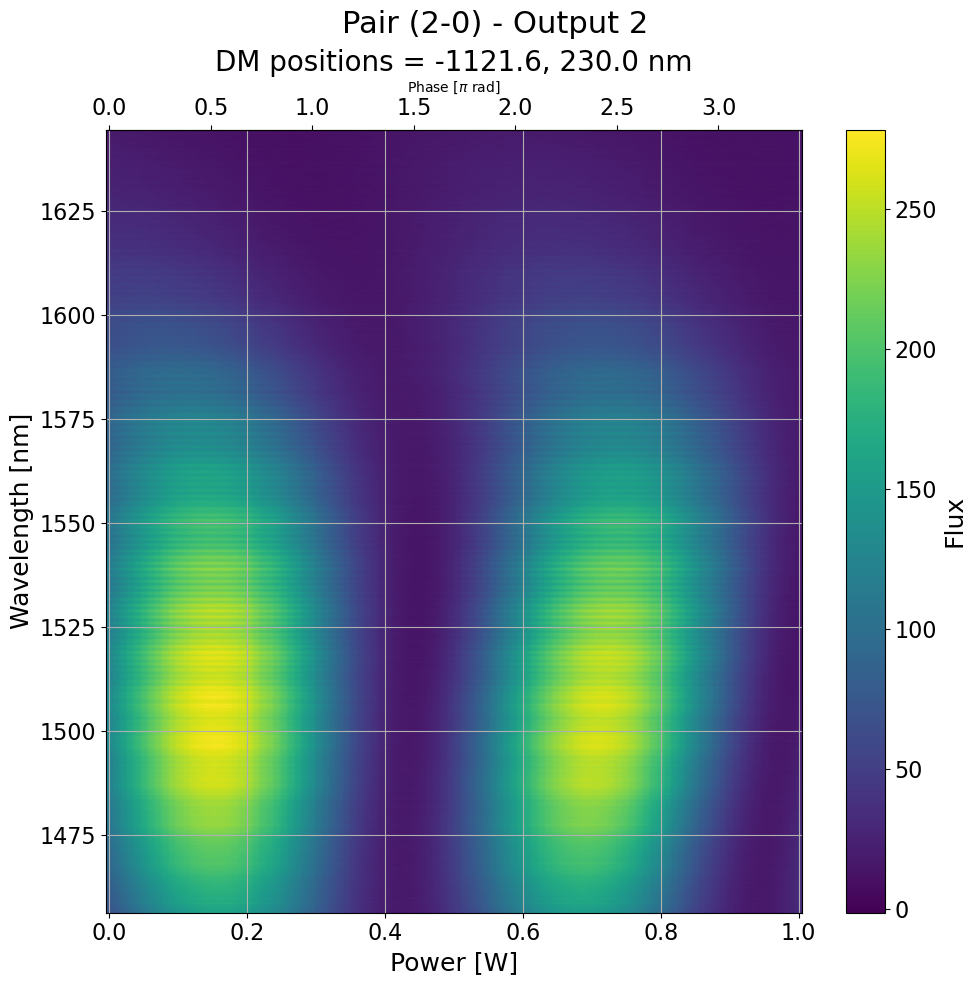

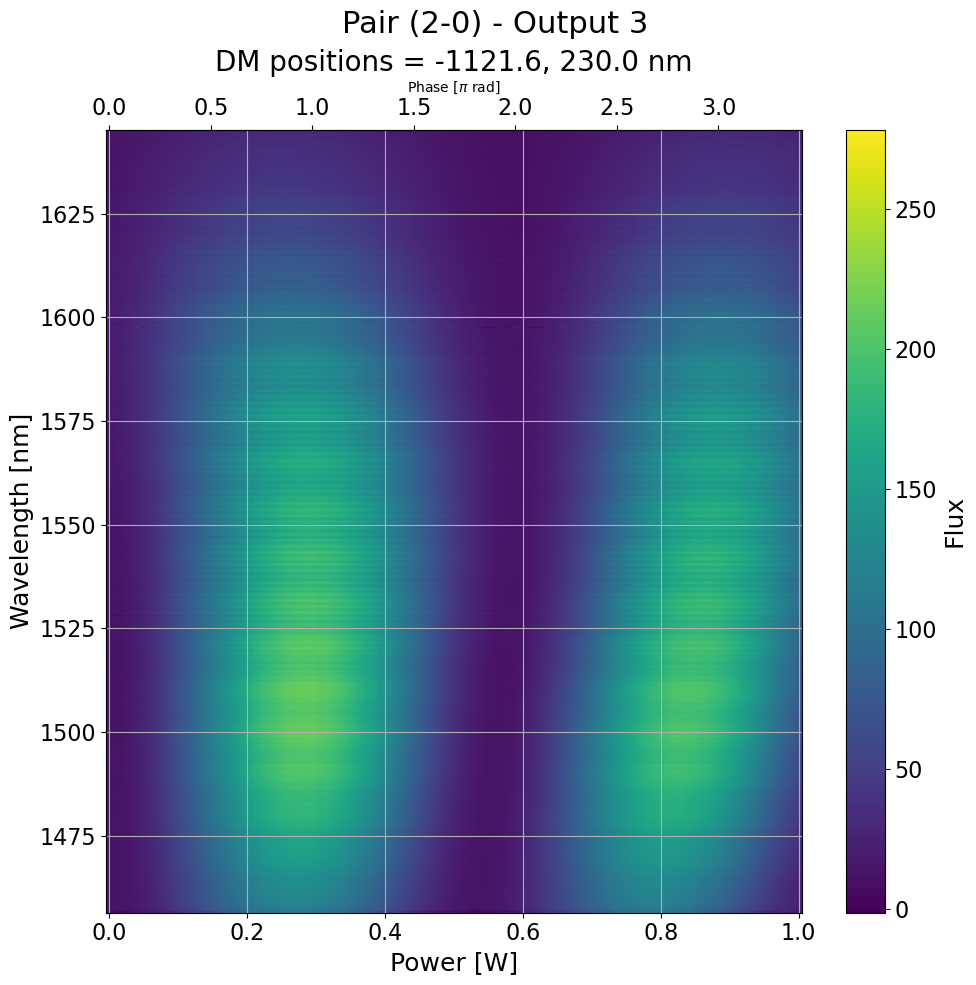

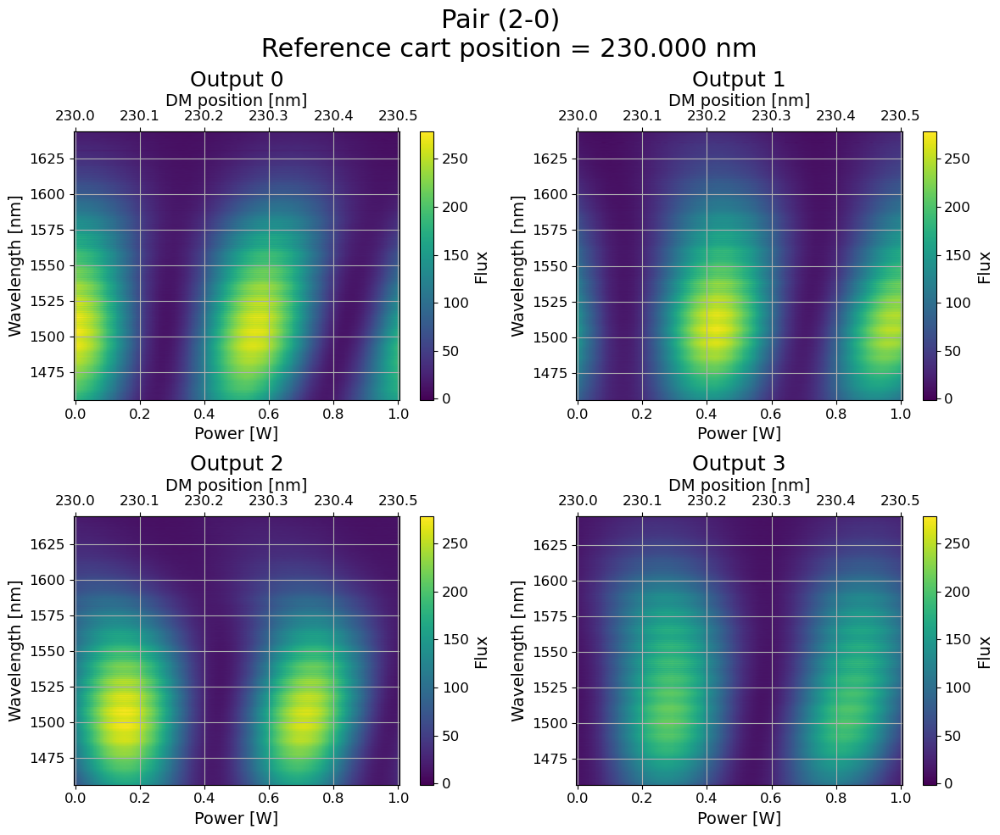

In [100]:
n_roi = 4
fig, axs = plt.subplots(1, 1, figsize=(10, 10))
fig.suptitle(f'Pair ({pair[0]}-{pair[1]})')
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
for o in range(n_roi):
    axs.plot(power_ramp, data[:, o], color=colors[o], label=f'Output {o}')
axs.plot(power_ramp, data.mean(1), color='k', linestyle='-', alpha=0.6, label='Mean')

axs.set_title(f'Output {o} \n DM positions = {end:.1f}, {ref_cart:.1f} nm')
axs.set_xlabel('Power [W]')
axs.set_ylabel('Flux')
axs.legend()
axs.grid()
axs.invert_xaxis()
phase_factor = chip.shifters[pair[0]].phase_factor
power_to_phase = lambda power: power / phase_factor / np.pi
phase_to_power = lambda phase: phase * phase_factor / np.pi
secax = axs.secondary_xaxis('top', functions=(power_to_phase, phase_to_power))
secax.set_xlabel(r'Phase [$\pi$ rad]')
fig.tight_layout()
filename = f'opd0_topa_scan_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_pos_{int(np.around(end))}nm_range_{int(power_ramp[0])}_{int(power_ramp[-1])}W{suffix}.png'
fig.savefig(path / filename, dpi=300, format='png')

for k in range(4):
    fig, axs = plt.subplots(1, 1, figsize=(10, 10))
    fig.suptitle(f'Pair ({pair[0]}-{pair[1]}) - Output {k}', fontsize=suptitle_fs)
    im = axs.imshow(spectral_data[:,k,:].T, aspect='auto', origin='lower', 
                    extent=[power_ramp.min() - power_step/2, power_ramp.max() + power_step/2, 
                            spectral_axs[k,0]-spec_law[k,0]/2, spectral_axs[k,-1]+spec_law[k,0]/2],
                    vmin = spectral_data.min(),
                    vmax = spectral_data.max())
    axs.tick_params(labelsize=tick_fs)
    axs.set_title(f'DM positions = {end:.1f}, {ref_cart:.1f} nm', fontsize=title_fs)
    axs.set_xlabel(r'Power [W]', fontsize=label_fs)
    axs.set_ylabel('Wavelength [nm]', fontsize=label_fs)
    axs.grid()
    cbar = fig.colorbar(im, ax=axs)
    cbar.set_label('Flux', fontsize=label_fs)
    cbar.ax.tick_params(labelsize=tick_fs)
    secax = axs.secondary_xaxis('top', functions=(power_to_phase, phase_to_power))
    secax.set_xlabel(r'Phase [$\pi$ rad]')
    secax.tick_params(labelsize=tick_fs)
    fig.tight_layout()
    filename = f'opd0_topa_scan_spectral_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_pos_{int(np.around(end))}nm_range_{int(power_ramp[0])}_{int(power_ramp[-1])}W_output{k}{suffix}.png'
    fig.savefig(path / filename, dpi=300, format='png')

suptitle_fs = 22
title_fs = 18
label_fs = 14
tick_fs = 12
legend_fs = 12

opd_to_piston = lambda opd: opd / 2.0 + ref_cart
piston_to_opd = lambda piston: (piston - ref_cart) * 2.0
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()
fig.suptitle(
    f'Pair ({pair[0]}-{pair[1]}) \n Reference cart position = {ref_cart:.3f} nm',
    fontsize=suptitle_fs,
)
for o in range(4):
    im = axs[o].imshow(
        spectral_data[:, o, :].T,
        aspect='auto',
        origin='lower',
        extent=[
            power_ramp.min() - power_step / 2,
            power_ramp.max() + power_step / 2,
            spectral_axs[o,0]-spec_law[o,0]/2, 
            spectral_axs[o,-1]+spec_law[o,0]/2,
        ],
        vmin = spectral_data.min(),
        vmax = spectral_data.max()
    )
    axs[o].tick_params(labelsize=tick_fs)
    axs[o].set_title(f'Output {o}', fontsize=title_fs)
    axs[o].set_xlabel(r'Power [W]', fontsize=label_fs)
    axs[o].set_ylabel('Wavelength [nm]', fontsize=label_fs)
    axs[o].grid()

    # Add colorbar attached to the current subplot
    cbar = fig.colorbar(im, ax=axs[o])
    cbar.set_label('Flux', fontsize=label_fs)
    cbar.ax.tick_params(labelsize=tick_fs)

    secax = axs[o].secondary_xaxis('top', functions=(opd_to_piston, piston_to_opd))
    secax.set_xlabel('DM position [nm]', fontsize=label_fs)
    secax.tick_params(labelsize=tick_fs)

fig.tight_layout()
filename = f'opd0_topa_scan_spectral_pair_{pair[0]}-{pair[1]}_ref_{int(ref_cart)}nm_pos_{int(np.around(end))}nm_range_{int(power_ramp[0])}_{int(power_ramp[-1])}W{suffix}.png'
fig.savefig(path / filename, dpi=300, format='png')

# The end

In [110]:
print('Path is', path)

inj.zero()

Path is /mnt/disk1/archive/2026-08-17_347a303/2_2T_charac
Injection ZERO on channels [0, 1, 2, 3] (segments [138, 137, 136, 135])


In [111]:
phobos.XPOW().turn_off()